# Problem Statement:

#### Businesses or companies can fall prey to default if they are not able to keep up their debt obligations. Defaults will lead to a lower credit rating for the company which in turn reduces its chances of getting credit in the future and may have to pay higher interests on existing debts as well as any new obligations. From an investor's point of view, he would want to invest in a company if it is capable of handling its financial obligations, can grow quickly, and is able to manage the growth scale.

#### A balance sheet is a financial statement of a company that provides a snapshot of what a company owns, owes, and the amount invested by the shareholders. Thus, it is an important tool that helps evaluate the performance of a business.

#### Data that is available includes information from the financial statement of the companies for the previous year (2015). Also, information about the Networth of the company in the following year (2016) is provided which can be used to drive the labeled field.

### --------------------------------------------------------------------------------------------------------------------------

## Load the libraries

In [1]:
# Importing the libraries
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns # for making plots with seaborn
color = sns.color_palette()
import sklearn.metrics as metrics

import warnings
warnings.filterwarnings("ignore")

## Read the dataset

In [11]:
df = pd.read_excel("Company_Data2015.xlsx")
pd.set_option("display.max_columns", None)
df.head()

,Co_Code,Co_Name,Networth Next Year,Equity Paid Up,Networth,Capital Employed,Total Debt,Gross Block,Net Working Capital,Current Assets,Current Liabilities and Provisions,Total Assets/Liabilities,Gross Sales,Net Sales,Other Income,Value Of Output,Cost of Production,Selling Cost,PBIDT,PBDT,PBIT,PBT,PAT,Adjusted PAT,CP,Revenue earnings in forex,Revenue expenses in forex,Capital expenses in forex,Book Value (Unit Curr),Book Value (Adj.) (Unit Curr),Market Capitalisation,CEPS (annualised) (Unit Curr),Cash Flow From Operating Activities,Cash Flow From Investing Activities,Cash Flow From Financing Activities,ROG-Net Worth (%),ROG-Capital Employed (%),ROG-Gross Block (%),ROG-Gross Sales (%),ROG-Net Sales (%),ROG-Cost of Production (%),ROG-Total Assets (%),ROG-PBIDT (%),ROG-PBDT (%),ROG-PBIT (%),ROG-PBT (%),ROG-PAT (%),ROG-CP (%),ROG-Revenue earnings in forex (%),ROG-Revenue expenses in forex (%),ROG-Market Capitalisation (%),Current Ratio[Latest],Fixed Assets Ratio[Latest],Inventory Ratio[Latest],Debtors Ratio[Latest],Total Asset Turnover Ratio[Latest],Interest Cover Ratio[Latest],PBIDTM (%)[Latest],PBITM (%)[Latest],PBDTM (%)[Latest],CPM (%)[Latest],APATM (%)[Latest],Debtors Velocity (Days),Creditors Velocity (Days),Inventory Velocity (Days),Value of Output/Total Assets,Value of Output/Gross Block
0,16974,Hind.Cables,-8021.60,419.36,-7027.48,-1007.24,5936.03,474.30,-1076.34,40.50,1116.85,109.60,0.00,0.00,7.60,-0.07,137.67,0.00,-179.06,-926.52,-185.53,-932.99,-932.99,-937.85,-926.52,0.00,0.00,0.00,-167.58,-167.58,0.00,-22.09,-102.47,1.46,92.58,-15.31,-20.76,-9.75,0.00,0.00,1.38,-25.75,5.23,-19.29,4.43,-19.33,-19.33,-19.29,0.00,0.00,0.00,0.02,0.00,0.00,0.00,0.00,-0.20,0.00,0.00,0.00,0.00,0.00,0,0,45.0,0.00,0.00
1,21214,Tata Tele. Mah.,-3986.19,1954.93,-2968.08,4458.20,7410.18,9070.86,-1098.88,486.86,1585.74,6043.94,2892.73,2892.73,46.27,2900.71,2572.46,40.51,646.46,-4.32,35.53,-615.25,-615.25,-617.14,-4.32,6.35,143.42,141.17,-15.18,-15.18,1544.39,-0.02,635.91,-785.00,176.93,-26.15,6.30,3.17,5.92,5.92,13.16,6.66,5.24,-108.77,614.89,-9.85,-9.85,-108.77,1.93,34.00,6.61,0.08,0.25,804.44,10.35,0.30,-0.84,-10.30,-39.74,-57.74,-57.74,-87.18,29,101,2.0,0.31,0.24
2,14852,ABG Shipyard,-3192.58,53.84,506.86,7714.68,6944.54,1281.54,4496.25,9097.64,4601.39,12316.07,392.13,392.13,9.55,301.16,408.51,54.83,-281.92,-1086.71,-381.10,-1185.89,-897.70,-873.39,-798.52,0.00,86.36,2.27,94.14,94.14,1220.81,-148.31,-873.40,-458.27,1187.51,-61.86,15.66,-2.07,-75.87,-75.87,-69.93,-0.78,-169.69,-431.68,-221.85,-300.41,-350.43,-642.67,-100.00,-81.21,-6.31,1.06,0.03,0.01,0.42,0.00,-2.21,-5279.14,-5516.98,-7780.25,-7723.67,-7961.51,97,558,0.0,-0.03,-0.26
3,2439,GTL,-3054.51,157.30,-623.49,2353.88,2326.05,1033.69,-2612.42,1034.12,3646.54,6000.42,1354.39,1354.39,223.85,1350.14,1326.99,3.34,-213.01,-677.57,-336.73,-801.29,-801.29,-770.18,-677.57,0.89,28.88,0.00,-39.64,-39.64,194.27,-43.08,324.47,17.31,-412.55,-450.67,-40.84,-1.80,8.33,8.33,16.59,-10.12,-203.84,-102.72,-455.28,-80.23,-70.57,-88.52,-52.91,-33.85,-13.94,0.09,5.08,411.15,9.26,0.00,-0.16,-3.33,-7.21,-48.13,-47.70,-51.58,93,63,2.0,0.24,1.90
4,23505,Bharati Defence,-2967.36,50.30,-1070.83,4675.33,5740.90,1084.20,1836.23,4685.81,2849.58,7524.91,38.72,38.72,9.82,38.72,186.29,1.97,-647.86,-944.42,-710.13,-1006.69,-864.58,-327.77,-802.31,0.00,15.62,0.00,-212.89,-212.89,113.68,-159.50,-191.54,61.34,143.65,-559.83,-11.76,0.34,-80.61,-80.61,-48.80,-5.81,-40.07,3.28,-38.72,1.87,-2.59,-1.13,-100.00,-91.17,-12.91,0.50,0.05,0.02,1.28,0.01,-0.73,-295.55,-400.55,-845.88,379.79,274.79,3887,346,0.0,0.01,0.05


In [12]:
print('The number of rows (observations) is',df.shape[0],'\n''The number of columns (variables) is',df.shape[1])

The number of rows (observations) is 3586 
The number of columns (variables) is 67


In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3586 entries, 0 to 3585
Data columns (total 67 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Co_Code                              3586 non-null   int64  
 1   Co_Name                              3586 non-null   object 
 2   Networth Next Year                   3586 non-null   float64
 3   Equity Paid Up                       3586 non-null   float64
 4   Networth                             3586 non-null   float64
 5   Capital Employed                     3586 non-null   float64
 6   Total Debt                           3586 non-null   float64
 7   Gross Block                          3586 non-null   float64
 8   Net Working Capital                  3586 non-null   float64
 9   Current Assets                       3586 non-null   float64
 10  Current Liabilities and Provisions   3586 non-null   float64
 11  Total Assets/Liabilities      

In [14]:
#statistical summary
df.describe().round(2)

,Co_Code,Networth Next Year,Equity Paid Up,Networth,Capital Employed,Total Debt,Gross Block,Net Working Capital,Current Assets,Current Liabilities and Provisions,Total Assets/Liabilities,Gross Sales,Net Sales,Other Income,Value Of Output,Cost of Production,Selling Cost,PBIDT,PBDT,PBIT,PBT,PAT,Adjusted PAT,CP,Revenue earnings in forex,Revenue expenses in forex,Capital expenses in forex,Book Value (Unit Curr),Book Value (Adj.) (Unit Curr),Market Capitalisation,CEPS (annualised) (Unit Curr),Cash Flow From Operating Activities,Cash Flow From Investing Activities,Cash Flow From Financing Activities,ROG-Net Worth (%),ROG-Capital Employed (%),ROG-Gross Block (%),ROG-Gross Sales (%),ROG-Net Sales (%),ROG-Cost of Production (%),ROG-Total Assets (%),ROG-PBIDT (%),ROG-PBDT (%),ROG-PBIT (%),ROG-PBT (%),ROG-PAT (%),ROG-CP (%),ROG-Revenue earnings in forex (%),ROG-Revenue expenses in forex (%),ROG-Market Capitalisation (%),Current Ratio[Latest],Fixed Assets Ratio[Latest],Inventory Ratio[Latest],Debtors Ratio[Latest],Total Asset Turnover Ratio[Latest],Interest Cover Ratio[Latest],PBIDTM (%)[Latest],PBITM (%)[Latest],PBDTM (%)[Latest],CPM (%)[Latest],APATM (%)[Latest],Debtors Velocity (Days),Creditors Velocity (Days),Inventory Velocity (Days),Value of Output/Total Assets,Value of Output/Gross Block
count,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3582.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3586.00,3585.00,3585.00,3585.00,3585.00,3585.00,3585.00,3585.00,3585.00,3585.00,3585.00,3585.00,3586.00,3586.00,3483.00,3586.00,3586.00
mean,16065.39,725.05,62.97,649.75,2799.61,1994.82,594.18,410.81,1960.35,391.99,1778.45,1123.74,1079.70,48.73,1077.19,798.54,25.55,248.18,116.27,217.66,85.75,61.22,60.06,91.73,131.17,256.33,7.66,157.24,2243.15,1664.09,36.02,65.77,-60.87,11.44,1237.62,2988.88,37.55,242.67,242.59,310.49,2793.28,375.85,336.38,374.70,224.07,112.23,221.09,37.23,364.86,63.68,12.06,51.54,37.80,33.03,1.24,16.39,-51.16,-109.21,-311.57,-307.01,-365.06,603.89,2057.85,79.64,0.82,61.88
std,19776.82,4769.68,778.76,4091.99,26975.14,23652.84,4871.55,6301.22,22577.57,2675.00,11437.57,10603.70,9996.57,426.04,9843.88,9076.70,194.24,1949.59,956.20,1850.97,799.93,620.30,580.43,780.79,1150.73,4132.34,111.43,1622.66,128283.73,12805.17,828.42,1455.05,701.97,1272.26,41041.93,126472.87,893.62,6103.53,6103.49,5573.22,125941.65,23278.40,20353.40,22462.79,19659.23,13480.52,13980.20,658.67,15233.64,1047.93,108.41,681.15,458.19,489.56,2.67,351.74,1795.13,3057.64,10921.59,10676.15,12500.05,10636.76,54169.48,137.85,1.20,976.82
min,4.00,-8021.60,0.00,-7027.48,-1824.75,-0.72,-41.19,-13162.42,-0.91,-0.23,-4.51,-62.59,-62.59,-448.72,-119.10,-22.65,0.00,-4655.14,-5874.53,-4812.95,-6032.34,-6032.34,-4418.72,-5874.53,0.00,0.00,0.00,-3371.57,-33715.70,0.00,-1808.00,-25469.23,-23843.45,-38374.04,-14485.71,-8614.63,-116.12,-5503.70,-5503.70,-2130.23,-136.13,-52200.00,-52200.00,-58500.00,-78900.00,-114500.00,-52200.00,-100.00,-100.00,-98.05,0.00,0.00,0.00,0.00,0.00,-5450.00,-78870.45,-141600.00,-590500.00,-572000.00,-688600.00,0.00,0.00,-199.00,-0.33,-61.00
25%,3029.25,3.98,3.75,3.89,7.60,0.03,0.57,0.94,4.00,0.73,10.56,1.44,1.44,0.02,1.41,0.94,0.00,0.04,0.00,0.00,-0.06,-0.06,-0.09,0.00,0.00,0.00,0.00,7.96,7.06,0.00,0.00,-0.31,-5.12,-5.85,-1.49,-3.84,0.00,-8.08,-8.12,-7.24,-3.97,-23.36,-30.60,-31.35,-41.24,-43.73,-29.50,0.00,0.00,0.00,0.88,0.27,0.00,0.42,0.07,0.00,0.00,0.00,0.00,0.00,0.00,8.00,8.00,0.00,0.07,0.27
50%,6077.50,19.02,8.29,18.58,39.09,7.49,15.87,10.14,24.54,9.23,52.01,31.21,30.44,0.45,30.90,25.99,0.16,2.04,0.80,1.15,0.31,0.26,0.21,0.74,0.00,0.00,0.00,21.66,18.92,8.37,1.14,0.45,-0.12,0.00,1.84,1.38,0.25,3.31,3.20,4.42,1.48,4.57,3.36,2.13,0.02,0.00,4.62,0.00,0.00,0.00,1.36,1.

In [15]:
df_dictonary = pd.read_excel("Data_Dictionary.xlsx")
pd.set_option('display.max_colwidth', None)
pd.set_option("display.max_rows", None)
df_dictonary

,#,Field Name,Description,New Field Name
0,1,Co_Code,Company Code,Co_Code
1,2,Co_Name,Company Name,Co_Name
2,3,Networth Next Year,Value of a company as on 2016 - Next Year(difference between the value of total assets and total liabilities),Networth_Next_Year
3,4,Equity Paid Up,Amount that has been received by the company through the issue of shares to the shareholders,Equity_Paid_Up
4,5,Networth,Value of a company as on 2015 - Current Year,Networth
5,6,Capital Employed,Total amount of capital used for the acquisition of profits by a company,Capital_Employed
6,7,Total Debt,The sum of money borrowed by the company and is due to be paid,Total_Debt
7,8,Gross Block,Total value of all of the assets that a company owns,Gross_Block
8,9,Net Working Capital,"The difference between a company's current assets (cash, accounts receivable, inventories of raw materials and finished goods) and its current liabilities (accounts payable).",Net_Working_Capital
9,10,Current Assets,All the assets of a company that are expected to be sold or used as a result of standard business operations over the next year.,Curr_Assets


### Fixing messy column names for ease of use

In [16]:
# renaming the messey column name using the given new names in data dictonary

df.rename(columns=df_dictonary.set_index('Field Name')['New Field Name'], inplace=True)

In [17]:
#checking the new names
df.head(5)

,Co_Code,Co_Name,Networth_Next_Year,Equity_Paid_Up,Networth,Capital_Employed,Total_Debt,Gross_Block,Net_Working_Capital,Curr_Assets,Curr_Liab_and_Prov,Total_Assets_to_Liab,Gross_Sales,Net_Sales,Other_Income,Value_Of_Output,Cost_of_Prod,Selling_Cost,PBIDT,PBDT,PBIT,PBT,PAT,Adjusted_PAT,CP,Rev_earn_in_forex,Rev_exp_in_forex,Capital_exp_in_forex,Book_Value_Unit_Curr,Book_Value_Adj_Unit_Curr,Market_Capitalisation,CEPS_annualised_Unit_Curr,Cash_Flow_From_Opr,Cash_Flow_From_Inv,Cash_Flow_From_Fin,ROG_Net_Worth_perc,ROG_Capital_Employed_perc,ROG_Gross_Block_perc,ROG_Gross_Sales_perc,ROG_Net_Sales_perc,ROG_Cost_of_Prod_perc,ROG_Total_Assets_perc,ROG_PBIDT_perc,ROG_PBDT_perc,ROG_PBIT_perc,ROG_PBT_perc,ROG_PAT_perc,ROG_CP_perc,ROG_Rev_earn_in_forex_perc,ROG_Rev_exp_in_forex_perc,ROG_Market_Capitalisation_perc,Curr_Ratio_Latest,Fixed_Assets_Ratio_Latest,Inventory_Ratio_Latest,Debtors_Ratio_Latest,Total_Asset_Turnover_Ratio_Latest,Interest_Cover_Ratio_Latest,PBIDTM_perc_Latest,PBITM_perc_Latest,PBDTM_perc_Latest,CPM_perc_Latest,APATM_perc_Latest,Debtors_Vel_Days,Creditors_Vel_Days,Inventory_Vel_Days,Value_of_Output_to_Total_Assets,Value_of_Output_to_Gross_Block
0,16974,Hind.Cables,-8021.60,419.36,-7027.48,-1007.24,5936.03,474.30,-1076.34,40.50,1116.85,109.60,0.00,0.00,7.60,-0.07,137.67,0.00,-179.06,-926.52,-185.53,-932.99,-932.99,-937.85,-926.52,0.00,0.00,0.00,-167.58,-167.58,0.00,-22.09,-102.47,1.46,92.58,-15.31,-20.76,-9.75,0.00,0.00,1.38,-25.75,5.23,-19.29,4.43,-19.33,-19.33,-19.29,0.00,0.00,0.00,0.02,0.00,0.00,0.00,0.00,-0.20,0.00,0.00,0.00,0.00,0.00,0,0,45.0,0.00,0.00
1,21214,Tata Tele. Mah.,-3986.19,1954.93,-2968.08,4458.20,7410.18,9070.86,-1098.88,486.86,1585.74,6043.94,2892.73,2892.73,46.27,2900.71,2572.46,40.51,646.46,-4.32,35.53,-615.25,-615.25,-617.14,-4.32,6.35,143.42,141.17,-15.18,-15.18,1544.39,-0.02,635.91,-785.00,176.93,-26.15,6.30,3.17,5.92,5.92,13.16,6.66,5.24,-108.77,614.89,-9.85,-9.85,-108.77,1.93,34.00,6.61,0.08,0.25,804.44,10.35,0.30,-0.84,-10.30,-39.74,-57.74,-57.74,-87.18,29,101,2.0,0.31,0.24
2,14852,ABG Shipyard,-3192.58,53.84,506.86,7714.68,6944.54,1281.54,4496.25,9097.64,4601.39,12316.07,392.13,392.13,9.55,301.16,408.51,54.83,-281.92,-1086.71,-381.10,-1185.89,-897.70,-873.39,-798.52,0.00,86.36,2.27,94.14,94.14,1220.81,-148.31,-873.40,-458.27,1187.51,-61.86,15.66,-2.07,-75.87,-75.87,-69.93,-0.78,-169.69,-431.68,-221.85,-300.41,-350.43,-642.67,-100.00,-81.21,-6.31,1.06,0.03,0.01,0.42,0.00,-2.21,-5279.14,-5516.98,-7780.25,-7723.67,-7961.51,97,558,0.0,-0.03,-0.26
3,2439,GTL,-3054.51,157.30,-623.49,2353.88,2326.05,1033.69,-2612.42,1034.12,3646.54,6000.42,1354.39,1354.39,223.85,1350.14,1326.99,3.34,-213.01,-677.57,-336.73,-801.29,-801.29,-770.18,-677.57,0.89,28.88,0.00,-39.64,-39.64,194.27,-43.08,324.47,17.31,-412.55,-450.67,-40.84,-1.80,8.33,8.33,16.59,-10.12,-203.84,-102.72,-455.28,-80.23,-70.57,-88.52,-52.91,-33.85,-13.94,0.09,5.08,411.15,9.26,0.00,-0.16,-3.33,-7.21,-48.13,-47.70,-51.58,93,63,2.0,0.24,1.90
4,23505,Bharati Defence,-2967.36,50.30,-1070.83,4675.33,5740.90,1084.20,1836.23,4685.81,2849.58,7524.91,38.72,38.72,9.82,38.72,186.29,1.97,-647.86,-944.42,-710.13,-1006.69,-864.58,-327.77,-802.31,0.00,15.62,0.00,-212.89,-212.89,113.68,-159.50,-191.54,61.34,143.65,-559.83,-11.76,0.34,-80.61,-80.61,-48.80,-5.81,-40.07,3.28,-38.72,1.87,-2.59,-1.13,-100.00,-91.17,-12.91,0.50,0.05,0.02,1.28,0.01,-0.73,-295.55,-400.55,-845.88,379.79,274.79,3887,346,0.0,0.01,0.05


In [19]:
#checking duplicate rows
df.duplicated().sum()

0

#### Eliminating unnecessary columns

In [20]:
df = df.drop(['Co_Code', 'Co_Name'], axis = 1)

In [22]:
#dataframe after renaming and removing text variables and code
df2 = df

##  Outlier Treatment

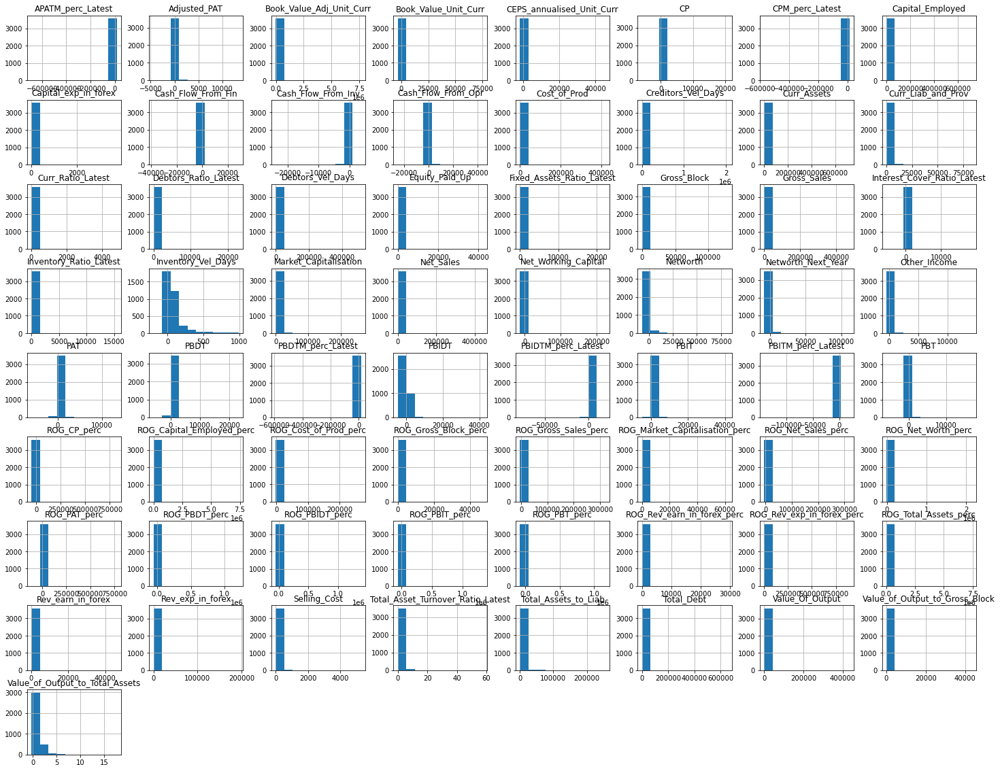

In [291]:
df2.hist(figsize=(25,20));

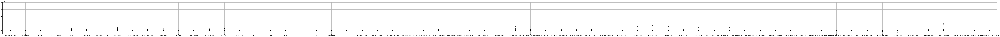

In [292]:
#plot outliers 
plt.figure(figsize=(150, 5))
df2.boxplot();

Shape before Outliers Treatment (3586, 65)


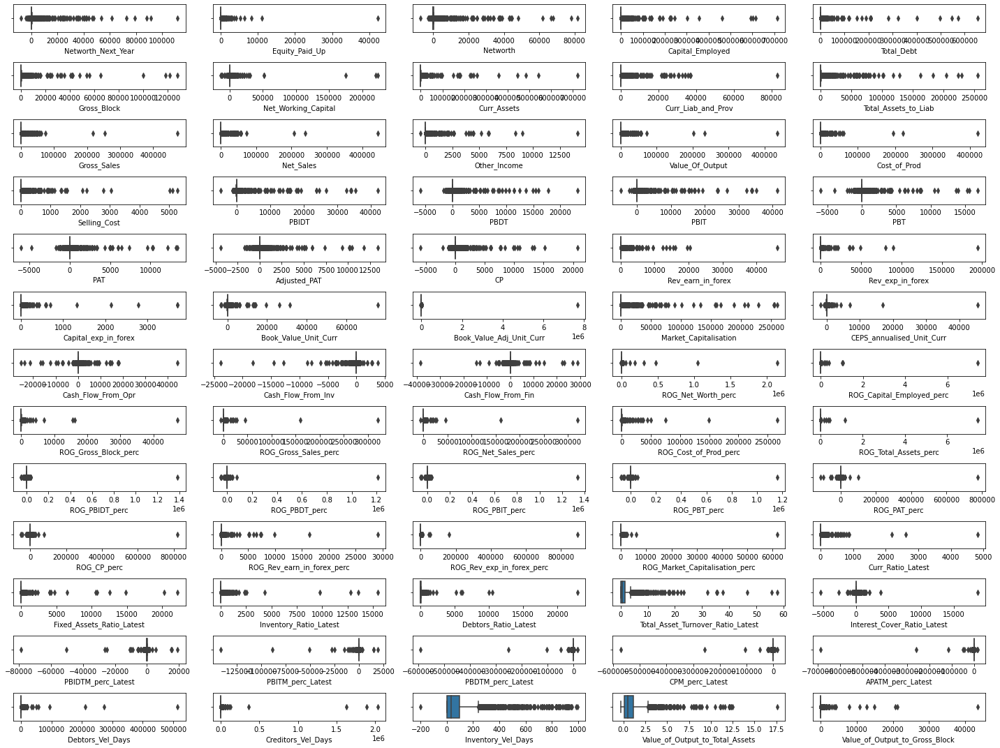

In [293]:
data_plot=df2
fig=plt.figure(figsize=(20,15));
for i in range(0,len(data_plot.columns)):
    ax=fig.add_subplot(13,5,i+1)
    sns.boxplot(data_plot[data_plot.columns[i]])
    plt.tight_layout()
print('Shape before Outliers Treatment',df2.shape)

In [23]:
#outlier treatment

def remove_outlier(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [24]:
for column in df2.columns:
    lr,ur=remove_outlier(df2[column])
    df2[column]=np.where(df2[column]>ur,ur,df2[column])
    df2[column]=np.where(df2[column]<lr,lr,df2[column])

Shape after Outliers Treatment (3586, 65)


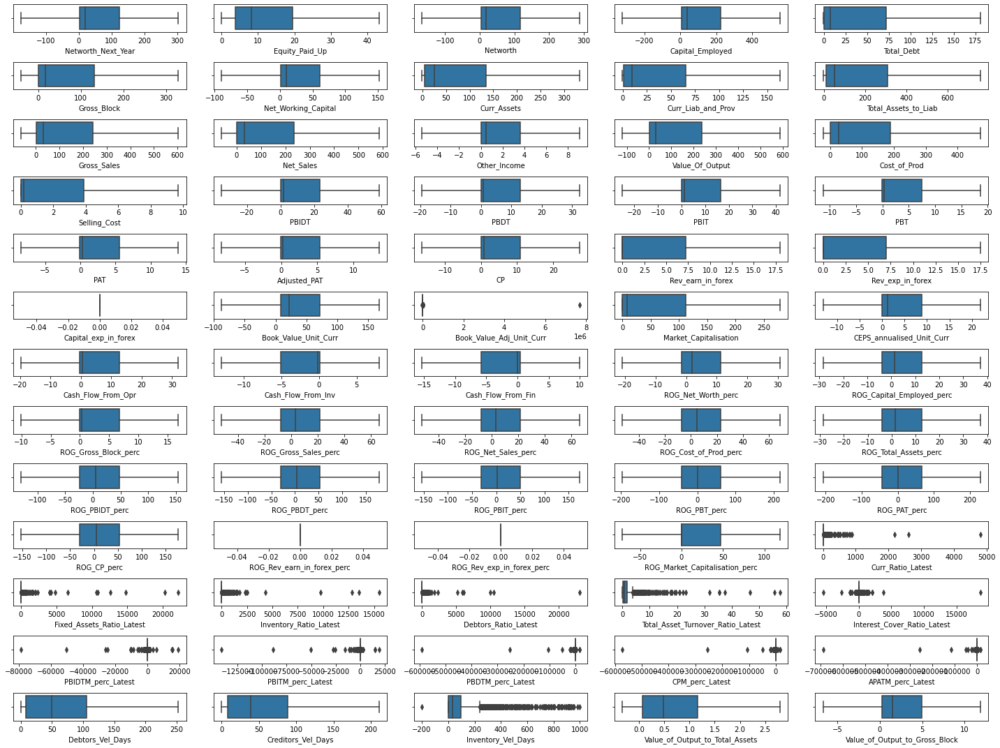

In [25]:
#plot outliers after outlier treatment 
data_plot=df2
fig=plt.figure(figsize=(20,15));
for i in range(0,len(data_plot.columns)):
    ax=fig.add_subplot(13,5,i+1)
    sns.boxplot(data_plot[data_plot.columns[i]])
    plt.tight_layout()
print('Shape after Outliers Treatment',df2.shape)

In [26]:
#dataframe after outlier treatment
df3 = df2

## Transform Target variable into 0 and 1

In [27]:
#Creating a binary target variable using 'Networth_Next_Year'

df3['default'] = np.where((df3['Networth_Next_Year'] > 0), 0, 1)

In [29]:
df3[['default','Networth_Next_Year']].head(10)

,default,Networth_Next_Year
0,1,-175.74125
1,1,-175.74125
2,1,-175.74125
3,1,-175.74125
4,1,-175.74125
5,1,-175.74125
6,1,-175.74125
7,1,-175.74125
8,1,-175.74125
9,1,-175.74125


In [30]:
df3.drop(['Networth_Next_Year'], axis = 1, inplace = True)

In [31]:
df3['default'].value_counts()

0    3198
1     388
Name: default, dtype: int64

## Missing Value Treatment

In [35]:
df3.isnull().sum().sum()

118

In [36]:
#checking missing value
df3.isnull().sum().sort_values(ascending = False)

Inventory_Vel_Days                   103
Book_Value_Adj_Unit_Curr               4
PBITM_perc_Latest                      1
Curr_Ratio_Latest                      1
Fixed_Assets_Ratio_Latest              1
Inventory_Ratio_Latest                 1
Debtors_Ratio_Latest                   1
Interest_Cover_Ratio_Latest            1
PBIDTM_perc_Latest                     1
Total_Asset_Turnover_Ratio_Latest      1
PBDTM_perc_Latest                      1
CPM_perc_Latest                        1
APATM_perc_Latest                      1
Cost_of_Prod                           0
Rev_earn_in_forex                      0
Rev_exp_in_forex                       0
Capital_exp_in_forex                   0
CP                                     0
Adjusted_PAT                           0
PAT                                    0
PBT                                    0
PBIT                                   0
PBDT                                   0
PBIDT                                  0
Selling_Cost    

In [37]:
print('missing values in percentage')
df3.isnull().sum().sort_values(ascending = False)*100/df3.index.size

missing values in percentage


Inventory_Vel_Days                   2.872281
Book_Value_Adj_Unit_Curr             0.111545
PBITM_perc_Latest                    0.027886
Curr_Ratio_Latest                    0.027886
Fixed_Assets_Ratio_Latest            0.027886
Inventory_Ratio_Latest               0.027886
Debtors_Ratio_Latest                 0.027886
Interest_Cover_Ratio_Latest          0.027886
PBIDTM_perc_Latest                   0.027886
Total_Asset_Turnover_Ratio_Latest    0.027886
PBDTM_perc_Latest                    0.027886
CPM_perc_Latest                      0.027886
APATM_perc_Latest                    0.027886
Cost_of_Prod                         0.000000
Rev_earn_in_forex                    0.000000
Rev_exp_in_forex                     0.000000
Capital_exp_in_forex                 0.000000
CP                                   0.000000
Adjusted_PAT                         0.000000
PAT                                  0.000000
PBT                                  0.000000
PBIT                              

Missing values are present in few of columns. The biggest values is in the column "Inventory_Vel_Days".

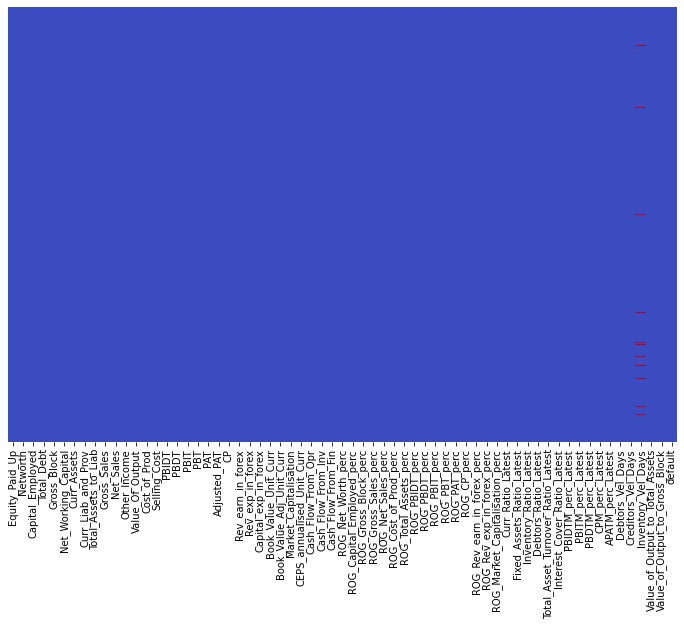

In [38]:
# Let's visually inspect the missing values in our data

plt.figure(figsize = (12,8))
sns.heatmap(df3.isnull(), cbar = False, cmap = 'coolwarm', yticklabels = False)
plt.show()

### Imputing the missing values

In [40]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=10)

In [41]:
df3 = pd.DataFrame(imputer.fit_transform(df3), columns = df3.columns)
df3.isnull().sum()

Equity_Paid_Up                       0
Networth                             0
Capital_Employed                     0
Total_Debt                           0
Gross_Block                          0
Net_Working_Capital                  0
Curr_Assets                          0
Curr_Liab_and_Prov                   0
Total_Assets_to_Liab                 0
Gross_Sales                          0
Net_Sales                            0
Other_Income                         0
Value_Of_Output                      0
Cost_of_Prod                         0
Selling_Cost                         0
PBIDT                                0
PBDT                                 0
PBIT                                 0
PBT                                  0
PAT                                  0
Adjusted_PAT                         0
CP                                   0
Rev_earn_in_forex                    0
Rev_exp_in_forex                     0
Capital_exp_in_forex                 0
Book_Value_Unit_Curr     

In [43]:
#datset after missing value treatment
df4=df3

## Univariate & Bivariate analysis with proper interpretation.

In [46]:
df4.head()

,Equity_Paid_Up,Networth,Capital_Employed,Total_Debt,Gross_Block,Net_Working_Capital,Curr_Assets,Curr_Liab_and_Prov,Total_Assets_to_Liab,Gross_Sales,Net_Sales,Other_Income,Value_Of_Output,Cost_of_Prod,Selling_Cost,PBIDT,PBDT,PBIT,PBT,PAT,Adjusted_PAT,CP,Rev_earn_in_forex,Rev_exp_in_forex,Capital_exp_in_forex,Book_Value_Unit_Curr,Book_Value_Adj_Unit_Curr,Market_Capitalisation,CEPS_annualised_Unit_Curr,Cash_Flow_From_Opr,Cash_Flow_From_Inv,Cash_Flow_From_Fin,ROG_Net_Worth_perc,ROG_Capital_Employed_perc,ROG_Gross_Block_perc,ROG_Gross_Sales_perc,ROG_Net_Sales_perc,ROG_Cost_of_Prod_perc,ROG_Total_Assets_perc,ROG_PBIDT_perc,ROG_PBDT_perc,ROG_PBIT_perc,ROG_PBT_perc,ROG_PAT_perc,ROG_CP_perc,ROG_Rev_earn_in_forex_perc,ROG_Rev_exp_in_forex_perc,ROG_Market_Capitalisation_perc,Curr_Ratio_Latest,Fixed_Assets_Ratio_Latest,Inventory_Ratio_Latest,Debtors_Ratio_Latest,Total_Asset_Turnover_Ratio_Latest,Interest_Cover_Ratio_Latest,PBIDTM_perc_Latest,PBITM_perc_Latest,PBDTM_perc_Latest,CPM_perc_Latest,APATM_perc_Latest,Debtors_Vel_Days,Creditors_Vel_Days,Inventory_Vel_Days,Value_of_Output_to_Total_Assets,Value_of_Output_to_Gross_Block,default
0,43.16875,-166.215,-320.90125,180.83,328.8825,-89.40625,40.50000,163.02625,109.6000,0.00000,0.00,7.6000,-0.070,137.670,0.00000,-35.1875,-19.4175,-25.00125,-11.28375,-8.46,-8.23875,-16.365,0.00,0.00000,0.0,-87.595,-167.58,0.00000,-13.15875,-19.74,1.46000,9.915,-15.3100,-20.76000,-9.75,0.00000,0.000,1.38,-25.75,5.23000,-19.29000,4.430,-19.33000,-19.3300,-19.29000,0.0,0.0,0.00,0.02,0.00,0.00,0.00,0.00,-0.20,0.00,0.00,0.00,0.00,0.00,0.0,0.0,45.0,0.00,0.00,1.0
1,43.16875,-166.215,555.10875,180.83,328.8825,-89.40625,332.19375,163.02625,760.5175,603.46125,583.94,9.0575,587.475,472.465,9.70625,58.7525,-4.3200,35.53000,-11.28375,-8.46,-8.23875,-4.320,6.35,17.46875,0.0,-15.180,-15.18,278.64375,-0.02000,32.08,-12.97375,9.915,-20.7625,6.30000,3.17,5.92000,5.920,13.16,6.66,5.24000,-108.77000,172.385,-9.85000,-9.8500,-108.77000,0.0,0.0,6.61,0.08,0.25,804.44,10.35,0.30,-0.84,-10.30,-39.74,-57.74,-57.74,-87.18,29.0,101.0,2.0,0.31,0.24,1.0
2,43.16875,287.405,555.10875,180.83,328.8825,151.52375,332.19375,163.02625,760.5175,392.13000,392.13,9.0575,301.160,408.510,9.70625,-35.1875,-19.4175,-25.00125,-11.28375,-8.46,-8.23875,-16.365,0.00,17.46875,0.0,94.140,94.14,278.64375,-13.15875,-19.74,-12.97375,9.915,-20.7625,15.66000,-2.07,-52.48125,-52.645,-52.79,-0.78,-130.21875,-155.86625,-153.595,-196.02375,-207.3525,-153.12375,0.0,0.0,-6.31,1.06,0.03,0.01,0.42,0.00,-2.21,-5279.14,-5516.98,-7780.25,-7723.67,-7961.51,97.0,210.5,0.0,-0.03,-0.26,1.0
3,43.16875,-166.215,555.10875,180.83,328.8825,-89.40625,332.19375,163.02625,760.5175,603.46125,583.94,9.0575,587.475,472.465,3.34000,-35.1875,-19.4175,-25.00125,-11.28375,-8.46,-8.23875,-16.365,0.89,17.46875,0.0,-39.640,-39.64,194.27000,-13.15875,32.08,7.97625,-15.305,-20.7625,-28.46875,-1.80,8.33000,8.330,16.59,-10.12,-130.21875,-102.72000,-153.595,-80.23000,-70.5700,-88.52000,0.0,0.0,-13.94,0.09,5.08,411.15,9.26,0.00,-0.16,-3.33,-7.21,-48.13,-47.70,-51.58,93.0,63.0,2.0,0.24,1.90,1.0
4,43.16875,-166.215,555.10875,180.83,328.8825,151.52375,332.19375,163.02625,760.5175,38.72000,38.72,9.0575,38.720,186.290,1.97000,-35.1875,-19.4175,-25.00125,-11.28375,-8.46,-8.23875,-16.365,0.00,15.62000,0.0,-87.595,-212.89,113.68000,-13.15875,-19.74,7.97625,9.915,-20.7625,-11.76000,0.34,-52.48125,-52.645,-48.80,-5.81,-40.07000,3.28000,-38.720,1.87000,-2.5900,-1.13000,0.0,0.0,-12.91,0.50,0.05,0.02,1.28,0.01,-0.73,-295.55,-400.55,-845.88,379.79,274.79,253.0,210.5,0.0,0.01,0.05,1.0


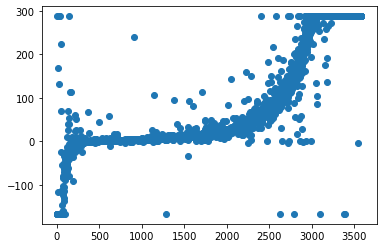

In [45]:
#scatter plot 
plt.scatter(df4.index, df4['Networth'])
plt.show()

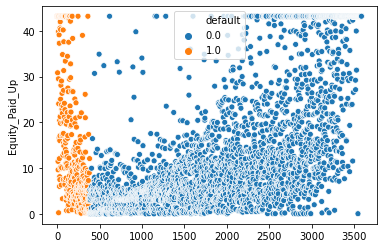

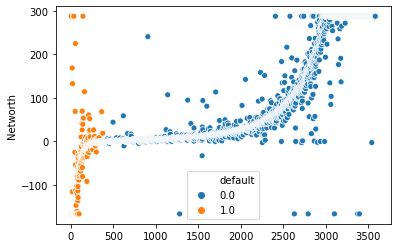

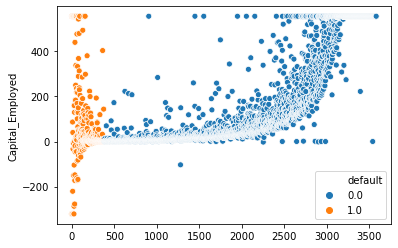

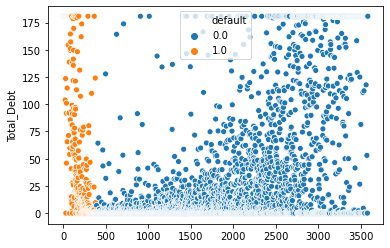

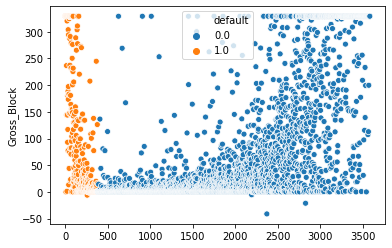

...

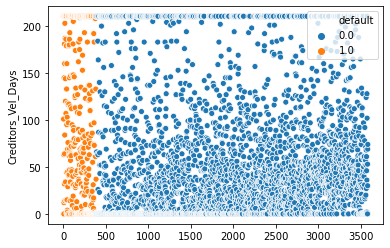

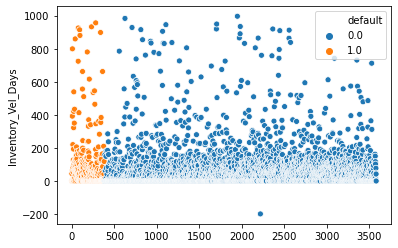

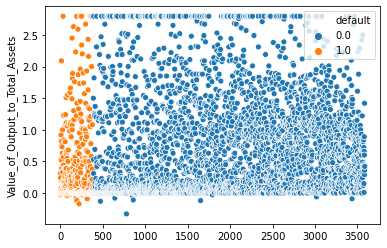

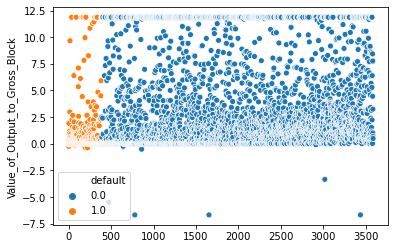

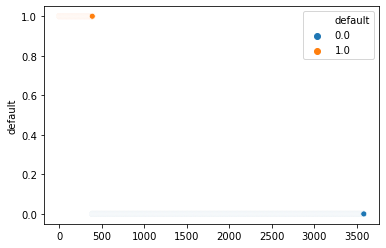

In [61]:
#scatter plot with hue based on default
splot_cols=df4.columns
for i in splot_cols:
    sns.scatterplot(x=df4.index, y=df4[i], hue=df4['default'])
    plt.show()

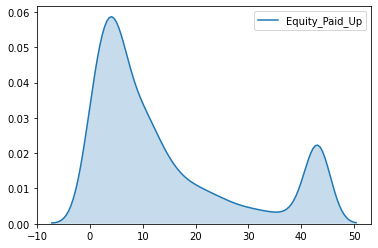

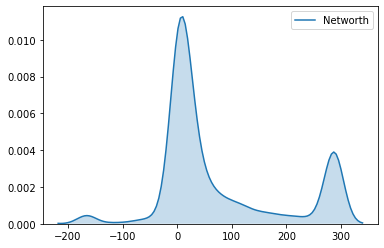

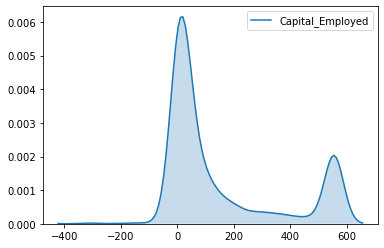

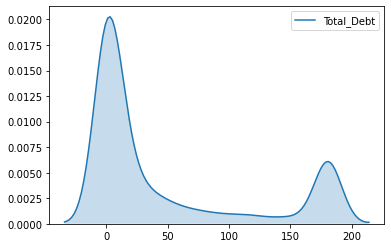

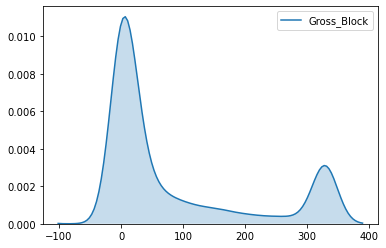

...

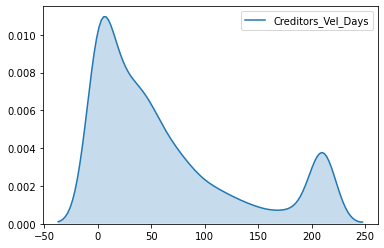

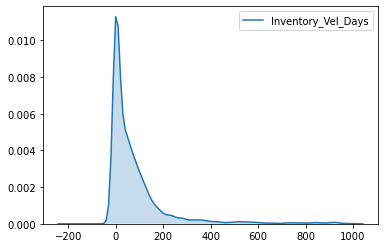

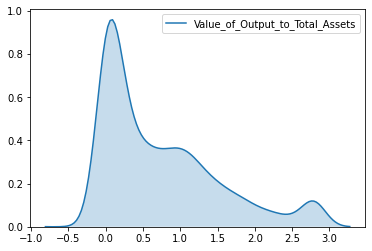

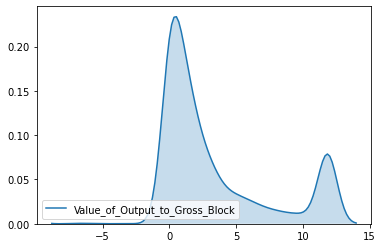

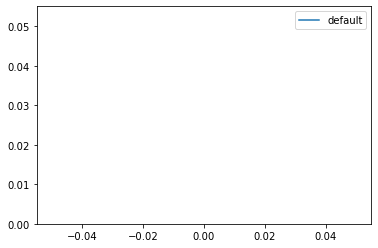

In [83]:
#density plot with hue based on default
for i in splot_cols:
    sns.kdeplot(df[i], shade=True)
    plt.show()

In [62]:
df4.corr()

,Equity_Paid_Up,Networth,Capital_Employed,Total_Debt,Gross_Block,Net_Working_Capital,Curr_Assets,Curr_Liab_and_Prov,Total_Assets_to_Liab,Gross_Sales,Net_Sales,Other_Income,Value_Of_Output,Cost_of_Prod,Selling_Cost,PBIDT,PBDT,PBIT,PBT,PAT,Adjusted_PAT,CP,Rev_earn_in_forex,Rev_exp_in_forex,Capital_exp_in_forex,Book_Value_Unit_Curr,Book_Value_Adj_Unit_Curr,Market_Capitalisation,CEPS_annualised_Unit_Curr,Cash_Flow_From_Opr,Cash_Flow_From_Inv,Cash_Flow_From_Fin,ROG_Net_Worth_perc,ROG_Capital_Employed_perc,ROG_Gross_Block_perc,ROG_Gross_Sales_perc,ROG_Net_Sales_perc,ROG_Cost_of_Prod_perc,ROG_Total_Assets_perc,ROG_PBIDT_perc,ROG_PBDT_perc,ROG_PBIT_perc,ROG_PBT_perc,ROG_PAT_perc,ROG_CP_perc,ROG_Rev_earn_in_forex_perc,ROG_Rev_exp_in_forex_perc,ROG_Market_Capitalisation_perc,Curr_Ratio_Latest,Fixed_Assets_Ratio_Latest,Inventory_Ratio_Latest,Debtors_Ratio_Latest,Total_Asset_Turnover_Ratio_Latest,Interest_Cover_Ratio_Latest,PBIDTM_perc_Latest,PBITM_perc_Latest,PBDTM_perc_Latest,CPM_perc_Latest,APATM_perc_Latest,Debtors_Vel_Days,Creditors_Vel_Days,Inventory_Vel_Days,Value_of_Output_to_Total_Assets,Value_of_Output_to_Gross_Block,default
Equity_Paid_Up,1.000000,0.575311,0.678049,0.573822,0.615089,0.388607,0.631646,0.646325,0.695357,0.564579,0.565780,0.547215,0.565715,0.537617,0.449257,0.455246,0.318126,0.382343,0.235951,0.236287,0.235459,0.324023,0.296983,0.382239,NaN,0.074402,0.028659,0.563498,0.045447,0.309522,-0.268042,-0.201008,-0.013370,-0.012628,0.124665,-0.045070,-0.046166,-0.034416,0.002733,-0.037336,-0.037749,-0.032949,-0.026517,-0.032777,-0.049977,NaN,NaN,0.127567,-0.028516,-0.017986,0.058818,0.001974,-0.085812,0.047355,-0.033848,-0.033410,-0.027134,-0.027406,-0.026719,0.041409,0.105388,0.036070,-0.083063,-0.037049,0.025170
Networth,0.575311,1.000000,0.873306,0.535012,0.665375,0.623119,0.760024,0.683618,0.836822,0.721942,0.723721,0.663716,0.727349,0.673156,0.593682,0.787430,0.696443,0.741600,0.618249,0.619903,0.616226,0.705317,0.449846,0.533567,NaN,0.592468,0.032515,0.740522,0.461981,0.493641,-0.447688,-0.282301,0.228486,0.185036,0.263656,0.040401,0.041592,0.042936,0.164100,0.018649,0.016623,0.030367,0.031570,0.029498,0.010003,NaN,NaN,0.265314,-0.036157,-0.023142,0.052969,0.012551,-0.041306,0.089479,-0.013393,0.011467,0.016192,0.014730,0.017309,-0.043877,-0.032158,-0.003403,0.057532,0.050899,-0.335681
Capital_Employed,0.678049,0.873306,1.000000,0.781394,0.824900,0.688619,0.902837,0.834573,0.977779,0.825233,0.827319,0.741598,0.827751,0.792087,0.665321,0.766376,0.593961,0.689721,0.488696,0.492140,0.478390,0.606486,0.508536,0.604157,NaN,0.470570,0.032998,0.739920,0.359471,0.503145,-0.440459,-0.305763,0.112806,0.116741,0.250063,-0.013212,-0.013191,-0.006480,0.108672,-0.013276,-0.021135,0.002720,-0.001256,-0.007233,-0.032126,NaN,NaN,0.241921,-0.052912,-0.032911,0.048399,0.008436,-0.040522,0.068507,-0.023671,-0.011590,-0.007029,-0.007937,-0.006214,0.001483,0.034255,0.028109,0.045412,0.003880,-0.138860
Total_Debt,0.573822,0.535012,0.781394,1.000000,0.781595,0.574341,0.798859,0.780363,0.806901,0.727858,0.728285,0.600497,0.727520,0.718135,0.595529,0.573574,0.354797,0.486828,0.234827,0.238806,0.224134,0.368987,0.444829,0.527873,NaN,0.241273,0.032657,0.535833,0.178974,0.385344,-0.373496,-0.213436,-0.010714,0.020948,0.199889,-0.051143,-0.051944,-0.049504,0.036945,-0.050616,-0.065379,-0.036766,-0.045738,-0.050543,-0.075756,NaN,NaN,0.185386,-0.068828,-0.036197,0.026513,-0.004286,-0.019342,-0.030966,-0.042218,-0.051440,-0.049932,-0.049967,-0.049196,0.039065,0.100730,0.058655,0.069394,-0.058453,0.071048
Gross_Block,0.615089,0.665375,0.824900,0.781595,1.000000,0.527678,0.814709,0.850400,0.856130,0.833787,0.832207,0.721992,0.830015,0.836093,0.715865,0.691599,0.533308,0.587191,0.392171,0.393956,0.378879,0.547914,0.565897,0.654415,NaN,0.341511,0.033906,0.658276,0.324316,0.556852,-0.453231,-0.375921,0.046422,0.014397,0.235834,-0.035686,-0.036575,-0.043566,0.019247,-0.043658,-0.042816,-0.022617,-0.017231,-0.023582,-0.056500,NaN,NaN,0.254402,-0.068744,-0

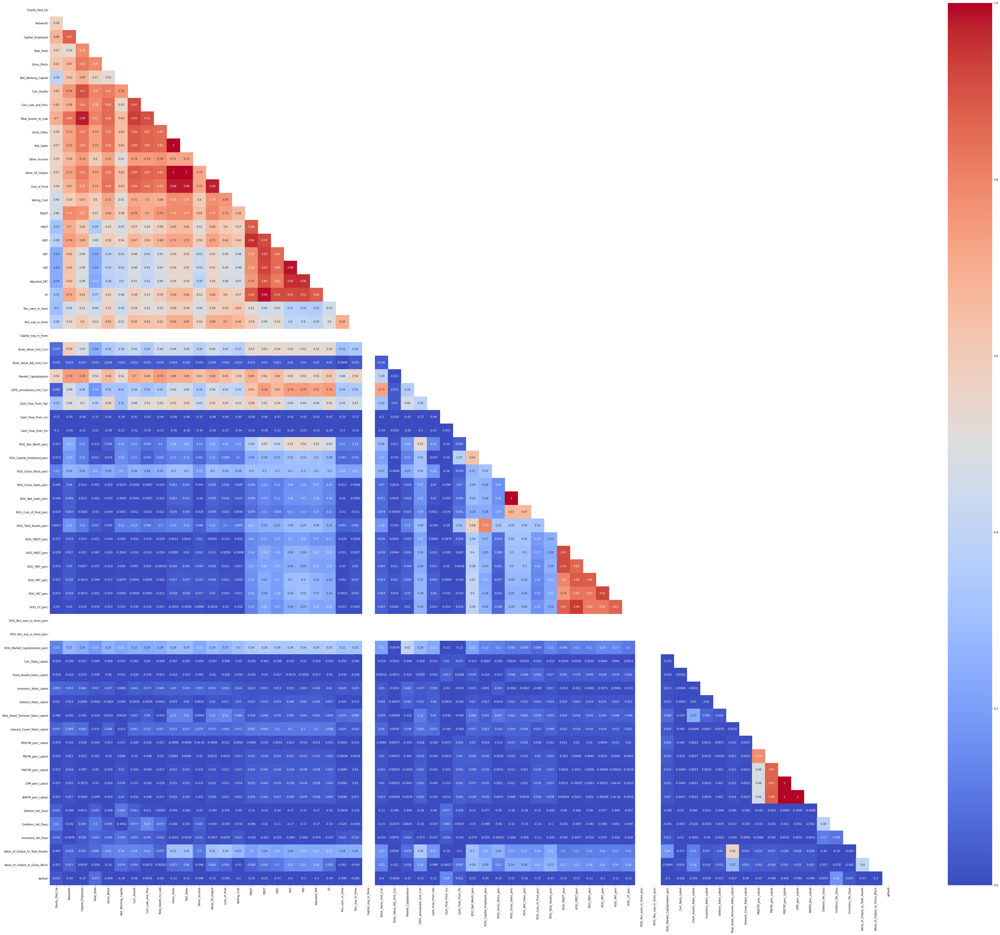

In [63]:
#correlation heatmap

plt.figure(figsize = (70,60))
sns.heatmap(df4.corr(), annot=True,mask=np.triu(df4.corr()),cmap ='coolwarm', vmin = 0, vmax= 1);

In [64]:
#let's drop the columns which do not contribute to the output

df4.drop(['Capital_exp_in_forex','ROG_Rev_exp_in_forex_perc', 'ROG_Rev_earn_in_forex_perc'], axis = 1, inplace = True)

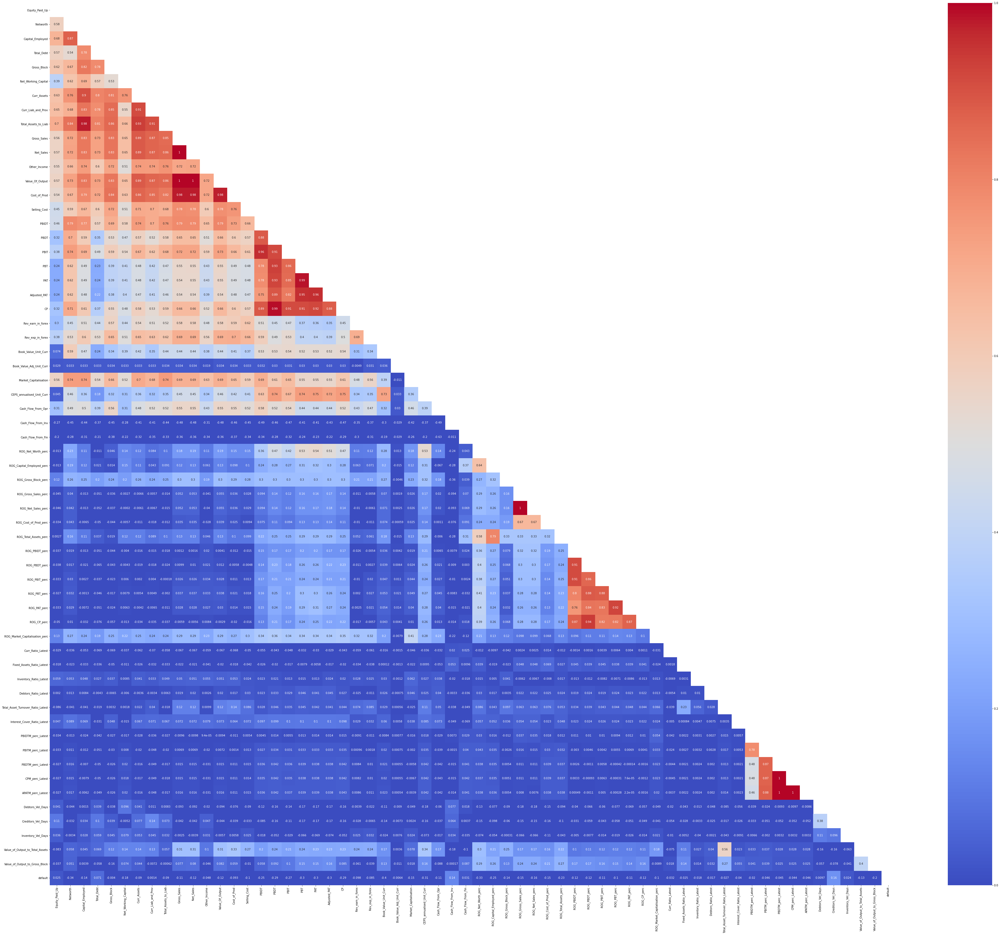

In [65]:
#correlation heatmap after removing redundant columns

plt.figure(figsize = (70,60))
sns.heatmap(df4.corr(), annot=True,mask=np.triu(df4.corr()),cmap ='coolwarm', vmin = 0, vmax= 1);

### Dimensionality reduction

In [68]:
cor_matrix = df4.corr().abs()
upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape),k=1).astype(np.bool))

In [69]:
# Droping the column with high correlation

to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.90)]
print('These are the highly correlated variables in the dataset with more than 90% of correlation', '\n'); print(to_drop)

These are the highly correlated variables in the dataset with more than 90% of correlation 

['Curr_Assets', 'Curr_Liab_and_Prov', 'Total_Assets_to_Liab', 'Net_Sales', 'Value_Of_Output', 'Cost_of_Prod', 'PBIT', 'PBT', 'PAT', 'Adjusted_PAT', 'CP', 'ROG_Net_Sales_perc', 'ROG_PBDT_perc', 'ROG_PBIT_perc', 'ROG_PAT_perc', 'ROG_CP_perc', 'CPM_perc_Latest', 'APATM_perc_Latest']


In [70]:
#Now we are droping the columns which are in the list 'to_drop' from the dataframe
df4.drop(['Curr_Assets', 'Curr_Liab_and_Prov', 'Total_Assets_to_Liab', 'Net_Sales', 'Value_Of_Output', 'Cost_of_Prod', 'PBIT', 'PBT', 'PAT', 'Adjusted_PAT', 'CP', 'ROG_Net_Sales_perc', 'ROG_PBDT_perc', 'ROG_PBIT_perc', 'ROG_PAT_perc', 'ROG_CP_perc', 'CPM_perc_Latest', 'APATM_perc_Latest'], axis = 1, inplace = True)

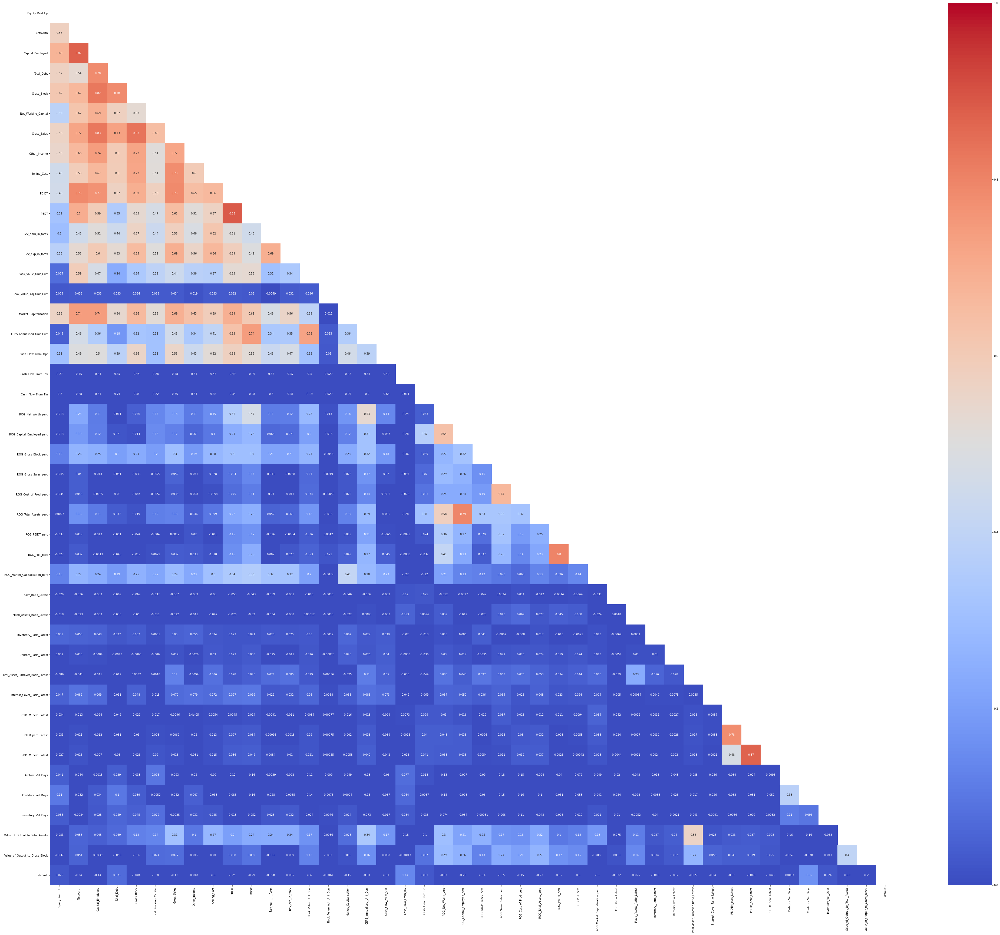

In [73]:
#correlation heatmap after removing redundant columns

plt.figure(figsize = (70,60))
sns.heatmap(df4.corr(), annot=True,mask=np.triu(df4.corr()),cmap ='coolwarm', vmin = 0, vmax= 1);

In [81]:
#dataset shape before dimensionality reduction
df2.shape

(3586, 65)

In [71]:
#dataset shape after dimensionality reduction
df4.shape

(3586, 44)

In [72]:
#dataframe after dimensionality reduction
df5 = df4

## Train Test Split

### Seperate the output/response variable

In [271]:
X = df5.drop(['default'], axis=1)
y = df5['default']

### Scaling the dataset before splitting

In [272]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = pd.DataFrame(scaler.fit_transform(X), columns = X.columns)

In [273]:
X.head()

,Equity_Paid_Up,Networth,Capital_Employed,Total_Debt,Gross_Block,Net_Working_Capital,Gross_Sales,Other_Income,Selling_Cost,PBIDT,PBDT,Rev_earn_in_forex,Rev_exp_in_forex,Book_Value_Unit_Curr,Book_Value_Adj_Unit_Curr,Market_Capitalisation,CEPS_annualised_Unit_Curr,Cash_Flow_From_Opr,Cash_Flow_From_Inv,Cash_Flow_From_Fin,ROG_Net_Worth_perc,ROG_Capital_Employed_perc,ROG_Gross_Block_perc,ROG_Gross_Sales_perc,ROG_Cost_of_Prod_perc,ROG_Total_Assets_perc,ROG_PBIDT_perc,ROG_PBT_perc,ROG_Market_Capitalisation_perc,Curr_Ratio_Latest,Fixed_Assets_Ratio_Latest,Inventory_Ratio_Latest,Debtors_Ratio_Latest,Total_Asset_Turnover_Ratio_Latest,Interest_Cover_Ratio_Latest,PBIDTM_perc_Latest,PBITM_perc_Latest,PBDTM_perc_Latest,Debtors_Vel_Days,Creditors_Vel_Days,Inventory_Vel_Days,Value_of_Output_to_Total_Assets,Value_of_Output_to_Gross_Block
0,2.08394,-2.124536,-2.277679,1.955653,2.011189,-2.126873,-0.711425,1.501295,-0.666143,-2.077966,-1.859258,-0.608804,-0.622212,-2.214710,-0.018786,-0.674189,-1.999442,-1.819798,0.652420,1.602304,-1.359175,-1.484629,-1.659245,-0.207335,-0.196704,-1.833941,-0.098314,-0.258933,-0.478238,-0.111032,-0.075668,-0.082505,-0.067471,-0.463186,-0.047295,0.028499,0.035717,0.028528,-0.919807,-0.916426,-0.252398,-0.943213,-0.818491
1,2.08394,-2.124536,1.937167,1.955653,2.011189,-2.126873,1.980032,1.924923,1.942957,1.877612,-0.797237,0.251664,1.864982,-1.009362,-0.017597,1.921603,-0.537951,1.786180,-1.754079,1.602304,-1.740519,0.115171,0.029268,-0.022351,0.159264,0.145722,-0.098180,-0.170047,-0.343213,-0.110479,-0.075301,1.673677,-0.046324,-0.350951,-0.049115,0.022760,0.022717,0.023239,-0.565502,0.565924,-0.568229,-0.543155,-0.759968
2,2.08394,1.892586,1.937167,1.955653,2.011189,1.933358,1.037488,1.924923,1.942957,-2.077966,-1.859258,-0.608804,1.864982,0.810270,-0.016744,1.921603,-1.999442,-1.819798,-1.754079,1.602304,-1.740519,0.668539,-0.655547,-1.847226,-1.833612,-0.308727,-1.903788,-1.915637,-0.607135,-0.101437,-0.075624,-0.082483,-0.066613,-0.463186,-0.053011,-2.913131,-1.769114,-0.684044,0.265280,2.173027,-0.582919,-0.981928,-0.881892
3,2.08394,-2.124536,1.937167,1.955653,2.011189,-2.126873,1.980032,1.924923,0.231669,-2.077966,-1.859258,-0.488203,1.864982,-1.416498,-0.017788,1.135594,-1.999442,1.786180,1.738857,-1.722936,-1.740519,-1.940375,-0.620261,0.052954,0.262912,-0.879232,-1.903788,-0.829939,-0.762995,-0.110387,-0.068208,0.815082,-0.048551,-0.463186,-0.047181,0.026644,0.033359,0.024120,0.216411,0.008208,-0.568229,-0.633491,-0.355179
4,2.08394,-2.124536,1.937167,1.955653,2.011189,1.933358,-0.538733,1.924923,-0.136595,-2.077966,-1.859258,-0.608804,1.601757,-2.214710,-0.019139,0.384833,-1.999442,-1.819798,1.738857,1.602304,-1.740519,-0.952545,-0.340584,-1.847226,-1.713042,-0.615969,-0.702143,-0.060159,-0.741955,-0.106604,-0.075595,-0.082461,-0.064855,-0.459445,-0.048802,-0.136187,-0.095319,-0.048944,2.171193,2.173027,-0.582919,-0.930308,-0.806299


In [274]:
X.isnull().sum().sum()

0

In [275]:
import pandas as pd

def clean_dataset(X):
    assert isinstance(X, pd.DataFrame), "X needs to be a pd.DataFrame"
    X.dropna(inplace=True)
    indices_to_keep = ~X.isin([np.nan, np.inf, -np.inf]).any(1)
    return X[indices_to_keep].astype(np.float64)

In [276]:
X.isna().sum().sum()

0

### Creating train & test datasets

In [277]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.33,random_state=42,stratify=df5['default'])

In [278]:
X_train.shape

(2402, 43)

In [279]:
X_test.shape

(1184, 43)

## Build Logistic Regression Model (using statsmodel library) on most important variables on Train Dataset and choose the optimum cutoff. Also showcase your model building approach

### we will use Logistic Regression for recursive feature elimination

In [280]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

In [281]:
LogR = LogisticRegression()
selector = RFE(estimator = LogR, n_features_to_select=15, step=1)
selector = selector.fit(X_train, y_train)
selector.n_features_

15

In [282]:
selector.ranking_

array([28,  1,  1,  1, 20,  4, 10,  8,  1,  1, 18, 13,  1,  1, 29,  1,  1,
       26, 14, 27,  1,  6, 12, 19,  2,  5, 24, 15, 21,  1,  3,  1,  1, 17,
        1, 23, 22,  9,  7, 16, 25, 11,  1])

In [283]:
scaled_predictors

array([0., 0., 0., ..., 0., 1., 0.])

In [284]:
df_ranked = pd.DataFrame({'Feature': X_train.columns, 'Rank': selector.ranking_})
df_ranked

,Feature,Rank
0,Equity_Paid_Up,28
1,Networth,1
2,Capital_Employed,1
3,Total_Debt,1
4,Gross_Block,20
5,Net_Working_Capital,4
6,Gross_Sales,10
7,Other_Income,8
8,Selling_Cost,1
9,PBIDT,1


In [285]:
df_ranked1 = pd.DataFrame(df_ranked[df_ranked['Rank'] == 1])
df_ranked1

,Feature,Rank
1,Networth,1
2,Capital_Employed,1
3,Total_Debt,1
8,Selling_Cost,1
9,PBIDT,1
12,Rev_exp_in_forex,1
13,Book_Value_Unit_Curr,1
15,Market_Capitalisation,1
16,CEPS_annualised_Unit_Curr,1
20,ROG_Net_Worth_perc,1


In [286]:
df_ranked1['Feature']

1                           Networth
2                   Capital_Employed
3                         Total_Debt
8                       Selling_Cost
9                              PBIDT
12                  Rev_exp_in_forex
13              Book_Value_Unit_Curr
15             Market_Capitalisation
16         CEPS_annualised_Unit_Curr
20                ROG_Net_Worth_perc
29                 Curr_Ratio_Latest
31            Inventory_Ratio_Latest
32              Debtors_Ratio_Latest
34       Interest_Cover_Ratio_Latest
42    Value_of_Output_to_Gross_Block
Name: Feature, dtype: object

These are the top 15 features with which we will start the modeling

In [287]:
X_train = X_train[['Networth','Capital_Employed','Total_Debt', 'Selling_Cost', 'PBIDT', 'Rev_exp_in_forex', 'Book_Value_Unit_Curr', 'Market_Capitalisation', 'CEPS_annualised_Unit_Curr', 'ROG_Net_Worth_perc', 'Curr_Ratio_Latest', 'Inventory_Ratio_Latest', 'Debtors_Ratio_Latest', 'Interest_Cover_Ratio_Latest', 'Value_of_Output_to_Gross_Block']]
X_test = X_test[['Networth','Capital_Employed','Total_Debt', 'Selling_Cost', 'PBIDT', 'Rev_exp_in_forex', 'Book_Value_Unit_Curr', 'Market_Capitalisation', 'CEPS_annualised_Unit_Curr', 'ROG_Net_Worth_perc', 'Curr_Ratio_Latest', 'Inventory_Ratio_Latest', 'Debtors_Ratio_Latest', 'Interest_Cover_Ratio_Latest', 'Value_of_Output_to_Gross_Block']]

In [288]:
X_train.head(3)

,Networth,Capital_Employed,Total_Debt,Selling_Cost,PBIDT,Rev_exp_in_forex,Book_Value_Unit_Curr,Market_Capitalisation,CEPS_annualised_Unit_Curr,ROG_Net_Worth_perc,Curr_Ratio_Latest,Inventory_Ratio_Latest,Debtors_Ratio_Latest,Interest_Cover_Ratio_Latest,Value_of_Output_to_Gross_Block
842,-0.621680,-0.716658,-0.694776,-0.663455,-0.589992,-0.622212,-0.577923,-0.674189,-0.491232,-0.268120,0.338774,-0.082505,-0.067471,-0.046726,-0.755091
1057,-0.605740,-0.707757,-0.695216,-0.628510,-0.574833,-0.622212,-0.571265,-0.674189,-0.418930,1.854366,0.002180,0.019250,-0.044648,-0.058471,0.186164
1595,-0.533034,-0.668736,-0.695509,-0.666143,-0.586624,-0.622212,-0.739546,1.722583,-0.534614,-0.204475,-0.051796,-0.078008,-0.063772,-0.046726,-0.818491


## Modelling using Logistic Regression

In [289]:
import statsmodels.formula.api as SM

In [290]:
#Statsmodel requires the labelled data, therefore, concatinating the y label to the train set.
Default_train = pd.concat([X_train,y_train], axis=1)
Default_test = pd.concat([X_test,y_test], axis=1)

In [291]:
Default_train["default"].value_counts()

0.0    2142
1.0     260
Name: default, dtype: int64

In [292]:
Default_train.default.sum() / len(Default_train.default)

0.10824313072439634

## Feature Selection

### Model.1

In [293]:
Default_train.columns

Index(['Networth', 'Capital_Employed', 'Total_Debt', 'Selling_Cost', 'PBIDT',
       'Rev_exp_in_forex', 'Book_Value_Unit_Curr', 'Market_Capitalisation',
       'CEPS_annualised_Unit_Curr', 'ROG_Net_Worth_perc', 'Curr_Ratio_Latest',
       'Inventory_Ratio_Latest', 'Debtors_Ratio_Latest',
       'Interest_Cover_Ratio_Latest', 'Value_of_Output_to_Gross_Block',
       'default'],
      dtype='object')

In [294]:
#Creating our first model using all variables
model_1 = SM.logit(formula = 'default ~ Networth + Capital_Employed + Total_Debt + Selling_Cost + PBIDT + Rev_exp_in_forex + Book_Value_Unit_Curr + Market_Capitalisation + CEPS_annualised_Unit_Curr + ROG_Net_Worth_perc + Curr_Ratio_Latest + Inventory_Ratio_Latest + Debtors_Ratio_Latest + Interest_Cover_Ratio_Latest + Value_of_Output_to_Gross_Block', data=Default_train).fit()

Optimization terminated successfully.
         Current function value: 0.137806
         Iterations 12


In [295]:
#Checking the parameters

model_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                default   No. Observations:                 2402
Model:                          Logit   Df Residuals:                     2386
Method:                           MLE   Df Model:                           15
Date:                Mon, 06 Dec 2021   Pseudo R-squ.:                  0.5980
Time:                        15:47:31   Log-Likelihood:                -331.01
converged:                       True   LL-Null:                       -823.47
Covariance Type:            nonrobust   LLR p-value:                2.301e-200
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept                         -7.5241      0.505    -14.887      0.000      -8.515      -6.533
Networth                          -0.6488      0.417     -1.557      0.119      -1.465       0.168
Capital_Employed                  -0.5778      0.566     -1.020      0.308      -1.688       0.532
Total_Debt                         1.3585      0.375      3.622      0.000       0.623       2.094
Selling_Cost                      -0.3243      0.278     -1.168      0.243      -0.868       0.220
PBIDT                             -0.5765      0.329     -1.752      0.080      -1.221       0.068
Rev_exp_in_forex                   0.3099      0.226      1.372      0.170      -0.133       0.753
Book_Value_Unit_Curr              -6.0852      0.643     -9.460      0.000      -7.346      -4.824
Market_Capitalisation             -0.5763      0.307     -1.880      0.060      -1.177       0.024
CEPS_annualised_Unit_Curr         -0.4984      0.354     -1.406      0.160      -1.193       0.196
ROG_Net_Worth_perc                -0.4011      0.132     -3.045      0.002      -0.659      -0.143
Curr_Ratio_Latest                 -0.6999      0.651     -1.074      0.283      -1.977       0.577
Inventory_Ratio_Latest            -1.5284      1.127     -1.356      0.175      -3.738       0.681
Debtors_Ratio_Latest              -1.1137      1.821     -0.612      0.541      -4.683       2.455
Interest_Cover_Ratio_Latest       -0.4314      0.329     -1.312      0.190      -1.076       0.213
Value_of_Output_to_Gross_Block    -0.4849      0.160     -3.027      0.002      -0.799      -0.171
==================================================================================================

Possibly complete quasi-separation: A fraction 0.31 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

### Checking the Variance Inflation Factor

In [296]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calc_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

In [297]:
X = Default_train.drop('default', axis = 1)
calc_vif(X).sort_values(by = 'VIF', ascending = False)

,variables,VIF
1,Capital_Employed,10.551030
0,Networth,7.834030
4,PBIDT,4.958160
8,CEPS_annualised_Unit_Curr,3.867861
2,Total_Debt,3.726908
6,Book_Value_Unit_Curr,2.883421
7,Market_Capitalisation,2.637396
3,Selling_Cost,2.561793
5,Rev_exp_in_forex,2.035738
9,ROG_Net_Worth_perc,1.669261


In [298]:
X = X.drop('Capital_Employed', axis = 1)
calc_vif(X).sort_values(by = 'VIF', ascending = False)

,variables,VIF
3,PBIDT,4.937241
0,Networth,4.186332
7,CEPS_annualised_Unit_Curr,3.863714
5,Book_Value_Unit_Curr,2.882601
6,Market_Capitalisation,2.620175
2,Selling_Cost,2.558161
1,Total_Debt,2.056565
4,Rev_exp_in_forex,2.026963
8,ROG_Net_Worth_perc,1.652877
13,Value_of_Output_to_Gross_Block,1.118411


In [299]:
Default_train.drop('Capital_Employed', axis=1, inplace=True)
Default_train.columns

Index(['Networth', 'Total_Debt', 'Selling_Cost', 'PBIDT', 'Rev_exp_in_forex',
       'Book_Value_Unit_Curr', 'Market_Capitalisation',
       'CEPS_annualised_Unit_Curr', 'ROG_Net_Worth_perc', 'Curr_Ratio_Latest',
       'Inventory_Ratio_Latest', 'Debtors_Ratio_Latest',
       'Interest_Cover_Ratio_Latest', 'Value_of_Output_to_Gross_Block',
       'default'],
      dtype='object')

### Model 2.

In [300]:
#Creating our first model using all variables
model_2 = SM.logit(formula = 'default ~ Networth + Total_Debt + Selling_Cost + PBIDT + Rev_exp_in_forex + Book_Value_Unit_Curr + Market_Capitalisation + CEPS_annualised_Unit_Curr + ROG_Net_Worth_perc + Curr_Ratio_Latest + Inventory_Ratio_Latest + Debtors_Ratio_Latest + Interest_Cover_Ratio_Latest + Value_of_Output_to_Gross_Block', data=Default_train).fit()

Optimization terminated successfully.
         Current function value: 0.138026
         Iterations 12


In [301]:
model_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                default   No. Observations:                 2402
Model:                          Logit   Df Residuals:                     2387
Method:                           MLE   Df Model:                           14
Date:                Mon, 06 Dec 2021   Pseudo R-squ.:                  0.5974
Time:                        15:48:36   Log-Likelihood:                -331.54
converged:                       True   LL-Null:                       -823.47
Covariance Type:            nonrobust   LLR p-value:                4.540e-201
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept                         -7.5471      0.510    -14.811      0.000      -8.546      -6.548
Networth                          -0.8686      0.352     -2.470      0.014      -1.558      -0.179
Total_Debt                         1.0725      0.242      4.431      0.000       0.598       1.547
Selling_Cost                      -0.3760      0.279     -1.345      0.178      -0.924       0.172
PBIDT                             -0.5928      0.330     -1.799      0.072      -1.239       0.053
Rev_exp_in_forex                   0.3181      0.225      1.411      0.158      -0.124       0.760
Book_Value_Unit_Curr              -6.1148      0.640     -9.549      0.000      -7.370      -4.860
Market_Capitalisation             -0.6607      0.300     -2.204      0.028      -1.248      -0.073
CEPS_annualised_Unit_Curr         -0.4813      0.352     -1.368      0.171      -1.171       0.208
ROG_Net_Worth_perc                -0.3968      0.131     -3.026      0.002      -0.654      -0.140
Curr_Ratio_Latest                 -0.7180      0.657     -1.093      0.274      -2.005       0.569
Inventory_Ratio_Latest            -1.7831      1.198     -1.488      0.137      -4.132       0.566
Debtors_Ratio_Latest              -1.0703      1.814     -0.590      0.555      -4.626       2.485
Interest_Cover_Ratio_Latest       -0.4291      0.331     -1.297      0.195      -1.078       0.219
Value_of_Output_to_Gross_Block    -0.4794      0.159     -3.006      0.003      -0.792      -0.167
==================================================================================================

Possibly complete quasi-separation: A fraction 0.32 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

Debtors_Ratio_Latest has the highest p-value and is insignificant, therefore, we need to eliminate it.

### Model.3

In [302]:
model_3 = SM.logit(formula = 'default ~ Networth + Total_Debt + Selling_Cost + PBIDT + Rev_exp_in_forex + Book_Value_Unit_Curr + Market_Capitalisation + CEPS_annualised_Unit_Curr + ROG_Net_Worth_perc + Curr_Ratio_Latest + Inventory_Ratio_Latest + Interest_Cover_Ratio_Latest + Value_of_Output_to_Gross_Block', data=Default_train).fit()

Optimization terminated successfully.
         Current function value: 0.138139
         Iterations 11


In [303]:
model_3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                default   No. Observations:                 2402
Model:                          Logit   Df Residuals:                     2388
Method:                           MLE   Df Model:                           13
Date:                Mon, 06 Dec 2021   Pseudo R-squ.:                  0.5971
Time:                        15:49:01   Log-Likelihood:                -331.81
converged:                       True   LL-Null:                       -823.47
Covariance Type:            nonrobust   LLR p-value:                6.691e-202
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept                         -7.5078      0.502    -14.955      0.000      -8.492      -6.524
Networth                          -0.8494      0.351     -2.419      0.016      -1.538      -0.161
Total_Debt                         1.0688      0.243      4.403      0.000       0.593       1.545
Selling_Cost                      -0.3801      0.278     -1.366      0.172      -0.925       0.165
PBIDT                             -0.5753      0.330     -1.742      0.081      -1.222       0.072
Rev_exp_in_forex                   0.3218      0.225      1.431      0.152      -0.119       0.762
Book_Value_Unit_Curr              -6.1340      0.641     -9.568      0.000      -7.391      -4.877
Market_Capitalisation             -0.6840      0.294     -2.325      0.020      -1.261      -0.107
CEPS_annualised_Unit_Curr         -0.4861      0.353     -1.379      0.168      -1.177       0.205
ROG_Net_Worth_perc                -0.4018      0.131     -3.065      0.002      -0.659      -0.145
Curr_Ratio_Latest                 -0.7118      0.654     -1.088      0.277      -1.994       0.571
Inventory_Ratio_Latest            -1.8011      1.171     -1.538      0.124      -4.097       0.495
Interest_Cover_Ratio_Latest       -0.4319      0.329     -1.314      0.189      -1.076       0.212
Value_of_Output_to_Gross_Block    -0.4848      0.158     -3.070      0.002      -0.794      -0.175
==================================================================================================

Possibly complete quasi-separation: A fraction 0.32 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

Curr_Ratio_Latest has the highest p-value and is insignificant, therefore, we need to eliminate it.

### Model.4

In [304]:
model_4 = SM.logit(formula = 'default ~ Networth + Total_Debt + Selling_Cost + PBIDT + Rev_exp_in_forex + Book_Value_Unit_Curr + Market_Capitalisation  + CEPS_annualised_Unit_Curr + ROG_Net_Worth_perc + Inventory_Ratio_Latest + Interest_Cover_Ratio_Latest + Value_of_Output_to_Gross_Block', data=Default_train).fit()

Optimization terminated successfully.
         Current function value: 0.138564
         Iterations 11


In [305]:
model_4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                default   No. Observations:                 2402
Model:                          Logit   Df Residuals:                     2389
Method:                           MLE   Df Model:                           12
Date:                Mon, 06 Dec 2021   Pseudo R-squ.:                  0.5958
Time:                        15:49:28   Log-Likelihood:                -332.83
converged:                       True   LL-Null:                       -823.47
Covariance Type:            nonrobust   LLR p-value:                1.986e-202
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept                         -7.5510      0.506    -14.928      0.000      -8.542      -6.560
Networth                          -0.8387      0.353     -2.379      0.017      -1.530      -0.148
Total_Debt                         1.0896      0.243      4.480      0.000       0.613       1.566
Selling_Cost                      -0.3819      0.280     -1.362      0.173      -0.932       0.168
PBIDT                             -0.5714      0.332     -1.722      0.085      -1.222       0.079
Rev_exp_in_forex                   0.3336      0.227      1.472      0.141      -0.111       0.778
Book_Value_Unit_Curr              -6.2499      0.641     -9.747      0.000      -7.507      -4.993
Market_Capitalisation             -0.6961      0.293     -2.375      0.018      -1.271      -0.122
CEPS_annualised_Unit_Curr         -0.4864      0.355     -1.370      0.171      -1.182       0.209
ROG_Net_Worth_perc                -0.4182      0.132     -3.178      0.001      -0.676      -0.160
Inventory_Ratio_Latest            -1.7889      1.194     -1.498      0.134      -4.129       0.551
Interest_Cover_Ratio_Latest       -0.4436      0.324     -1.369      0.171      -1.078       0.191
Value_of_Output_to_Gross_Block    -0.4809      0.157     -3.061      0.002      -0.789      -0.173
==================================================================================================

Possibly complete quasi-separation: A fraction 0.32 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

Selling_Cost has the highest p-value and is insignificant, therefore, we need to eliminate it.

### Model.5

In [306]:
model_5 = SM.logit(formula = 'default ~ Networth + Total_Debt + PBIDT + Rev_exp_in_forex + Book_Value_Unit_Curr + Market_Capitalisation  + CEPS_annualised_Unit_Curr + ROG_Net_Worth_perc + Inventory_Ratio_Latest + Interest_Cover_Ratio_Latest + Value_of_Output_to_Gross_Block', data=Default_train).fit()

Optimization terminated successfully.
         Current function value: 0.138969
         Iterations 11


In [307]:
model_5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                default   No. Observations:                 2402
Model:                          Logit   Df Residuals:                     2390
Method:                           MLE   Df Model:                           11
Date:                Mon, 06 Dec 2021   Pseudo R-squ.:                  0.5946
Time:                        15:49:48   Log-Likelihood:                -333.80
converged:                       True   LL-Null:                       -823.47
Covariance Type:            nonrobust   LLR p-value:                5.379e-203
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept                         -7.5289      0.505    -14.918      0.000      -8.518      -6.540
Networth                          -0.8268      0.353     -2.343      0.019      -1.519      -0.135
Total_Debt                         0.9580      0.225      4.258      0.000       0.517       1.399
PBIDT                             -0.5998      0.329     -1.824      0.068      -1.244       0.045
Rev_exp_in_forex                   0.2174      0.213      1.022      0.307      -0.199       0.634
Book_Value_Unit_Curr              -6.3105      0.645     -9.783      0.000      -7.575      -5.046
Market_Capitalisation             -0.7353      0.293     -2.511      0.012      -1.309      -0.161
CEPS_annualised_Unit_Curr         -0.4640      0.352     -1.319      0.187      -1.153       0.226
ROG_Net_Worth_perc                -0.3982      0.130     -3.070      0.002      -0.653      -0.144
Inventory_Ratio_Latest            -1.9713      1.267     -1.555      0.120      -4.455       0.513
Interest_Cover_Ratio_Latest       -0.4465      0.328     -1.361      0.173      -1.089       0.196
Value_of_Output_to_Gross_Block    -0.4859      0.159     -3.059      0.002      -0.797      -0.175
==================================================================================================

Possibly complete quasi-separation: A fraction 0.32 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

Rev_exp_in_forex has the highest p-value and is insignificant, therefore, we need to eliminate it.

### Model.6

In [308]:
model_6 = SM.logit(formula = 'default ~ Networth + Total_Debt + PBIDT + Book_Value_Unit_Curr + Market_Capitalisation  + CEPS_annualised_Unit_Curr + ROG_Net_Worth_perc + Inventory_Ratio_Latest + Interest_Cover_Ratio_Latest + Value_of_Output_to_Gross_Block', data=Default_train).fit()

Optimization terminated successfully.
         Current function value: 0.139182
         Iterations 11


In [309]:
model_6.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                default   No. Observations:                 2402
Model:                          Logit   Df Residuals:                     2391
Method:                           MLE   Df Model:                           10
Date:                Mon, 06 Dec 2021   Pseudo R-squ.:                  0.5940
Time:                        15:50:01   Log-Likelihood:                -334.32
converged:                       True   LL-Null:                       -823.47
Covariance Type:            nonrobust   LLR p-value:                8.798e-204
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept                         -7.5168      0.504    -14.910      0.000      -8.505      -6.529
Networth                          -0.8178      0.349     -2.344      0.019      -1.502      -0.134
Total_Debt                         1.0583      0.202      5.238      0.000       0.662       1.454
PBIDT                             -0.5462      0.323     -1.688      0.091      -1.180       0.088
Book_Value_Unit_Curr              -6.2788      0.642     -9.777      0.000      -7.537      -5.020
Market_Capitalisation             -0.7145      0.287     -2.490      0.013      -1.277      -0.152
CEPS_annualised_Unit_Curr         -0.4606      0.351     -1.312      0.190      -1.149       0.228
ROG_Net_Worth_perc                -0.4063      0.130     -3.128      0.002      -0.661      -0.152
Inventory_Ratio_Latest            -2.0299      1.288     -1.576      0.115      -4.554       0.494
Interest_Cover_Ratio_Latest       -0.4404      0.332     -1.325      0.185      -1.092       0.211
Value_of_Output_to_Gross_Block    -0.4748      0.157     -3.018      0.003      -0.783      -0.166
==================================================================================================

Possibly complete quasi-separation: A fraction 0.31 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

CEPS_annualised_Unit_Curr has the highest p-value and is insignificant, therefore, we need to eliminate it.

### Model.7

In [310]:
model_7 = SM.logit(formula = 'default ~ Networth + Total_Debt + PBIDT + Book_Value_Unit_Curr + Market_Capitalisation  + ROG_Net_Worth_perc + Inventory_Ratio_Latest + Interest_Cover_Ratio_Latest + Value_of_Output_to_Gross_Block', data=Default_train).fit()

Optimization terminated successfully.
         Current function value: 0.139541
         Iterations 11


In [311]:
model_7.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                default   No. Observations:                 2402
Model:                          Logit   Df Residuals:                     2392
Method:                           MLE   Df Model:                            9
Date:                Mon, 06 Dec 2021   Pseudo R-squ.:                  0.5930
Time:                        15:50:21   Log-Likelihood:                -335.18
converged:                       True   LL-Null:                       -823.47
Covariance Type:            nonrobust   LLR p-value:                1.928e-204
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept                         -7.3534      0.484    -15.183      0.000      -8.303      -6.404
Networth                          -0.8102      0.353     -2.292      0.022      -1.503      -0.118
Total_Debt                         1.1250      0.199      5.641      0.000       0.734       1.516
PBIDT                             -0.7685      0.286     -2.685      0.007      -1.329      -0.208
Book_Value_Unit_Curr              -6.2193      0.638     -9.750      0.000      -7.470      -4.969
Market_Capitalisation             -0.7431      0.286     -2.596      0.009      -1.304      -0.182
ROG_Net_Worth_perc                -0.4692      0.122     -3.847      0.000      -0.708      -0.230
Inventory_Ratio_Latest            -1.9878      1.292     -1.538      0.124      -4.521       0.545
Interest_Cover_Ratio_Latest       -0.4351      0.326     -1.336      0.182      -1.073       0.203
Value_of_Output_to_Gross_Block    -0.4700      0.158     -2.977      0.003      -0.779      -0.161
==================================================================================================

Possibly complete quasi-separation: A fraction 0.31 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

Interest_Cover_Ratio_Latest has the highest p-value and is insignificant, therefore, we need to eliminate it.

### Model.8

In [312]:
model_8 = SM.logit(formula = 'default ~ Networth + Total_Debt + PBIDT + Book_Value_Unit_Curr + Market_Capitalisation  + ROG_Net_Worth_perc + Inventory_Ratio_Latest + Value_of_Output_to_Gross_Block', data=Default_train).fit()

Optimization terminated successfully.
         Current function value: 0.139659
         Iterations 11


In [313]:
model_8.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                default   No. Observations:                 2402
Model:                          Logit   Df Residuals:                     2393
Method:                           MLE   Df Model:                            8
Date:                Mon, 06 Dec 2021   Pseudo R-squ.:                  0.5926
Time:                        15:55:46   Log-Likelihood:                -335.46
converged:                       True   LL-Null:                       -823.47
Covariance Type:            nonrobust   LLR p-value:                2.242e-205
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept                         -7.3385      0.483    -15.186      0.000      -8.286      -6.391
Networth                          -0.8121      0.354     -2.297      0.022      -1.505      -0.119
Total_Debt                         1.1298      0.199      5.677      0.000       0.740       1.520
PBIDT                             -0.7743      0.286     -2.712      0.007      -1.334      -0.215
Book_Value_Unit_Curr              -6.2276      0.640     -9.732      0.000      -7.482      -4.973
Market_Capitalisation             -0.7470      0.286     -2.608      0.009      -1.308      -0.186
ROG_Net_Worth_perc                -0.4691      0.122     -3.852      0.000      -0.708      -0.230
Inventory_Ratio_Latest            -1.9615      1.283     -1.529      0.126      -4.475       0.552
Value_of_Output_to_Gross_Block    -0.4720      0.158     -2.990      0.003      -0.781      -0.163
==================================================================================================

Possibly complete quasi-separation: A fraction 0.31 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

Inventory_Ratio_Latest has the highest p-value and is insignificant, therefore, we need to eliminate it.

### Model.9

In [314]:
model_9 = SM.logit(formula = 'default ~ Networth + Total_Debt + PBIDT + Book_Value_Unit_Curr + Market_Capitalisation + ROG_Net_Worth_perc + Value_of_Output_to_Gross_Block', data=Default_train).fit()

Optimization terminated successfully.
         Current function value: 0.140067
         Iterations 11


In [315]:
model_9.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                default   No. Observations:                 2402
Model:                          Logit   Df Residuals:                     2394
Method:                           MLE   Df Model:                            7
Date:                Mon, 06 Dec 2021   Pseudo R-squ.:                  0.5914
Time:                        15:56:07   Log-Likelihood:                -336.44
converged:                       True   LL-Null:                       -823.47
Covariance Type:            nonrobust   LLR p-value:                4.858e-206
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept                         -7.2051      0.466    -15.468      0.000      -8.118      -6.292
Networth                          -0.7906      0.351     -2.250      0.024      -1.479      -0.102
Total_Debt                         1.1148      0.198      5.620      0.000       0.726       1.504
PBIDT                             -0.7480      0.285     -2.625      0.009      -1.306      -0.190
Book_Value_Unit_Curr              -6.2362      0.639     -9.761      0.000      -7.488      -4.984
Market_Capitalisation             -0.7612      0.284     -2.680      0.007      -1.318      -0.205
ROG_Net_Worth_perc                -0.4728      0.121     -3.894      0.000      -0.711      -0.235
Value_of_Output_to_Gross_Block    -0.4841      0.157     -3.080      0.002      -0.792      -0.176
==================================================================================================

Possibly complete quasi-separation: A fraction 0.30 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

#### Now all the variables are significant, therefore, we don't need to eliminate any variable.

## Validate the Model on Test Dataset and state the performance matrices. Also state interpretation from the model

In [316]:
y_prob_pred_9 = model_9.predict(Default_train)

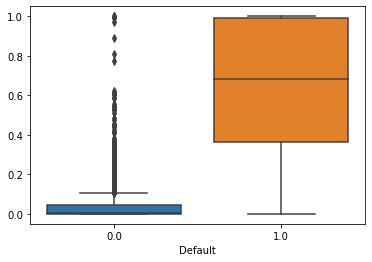

In [317]:
sns.boxplot(x=Default_train['default'],y=y_prob_pred_9)
plt.xlabel('Default');

Choosing the optimal threshold

In [318]:
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(Default_train['default'],y_prob_pred_train)

In [319]:
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
optimal_threshold

0.16890979736726333

#### Optimal Threshold is 0.1689

### Prediction on the Data

In [255]:
y_prob_pred_train = model_9.predict(Default_train)
y_prob_pred_train.round(3)

842     0.080
1057    0.019
1595    0.035
100     0.861
1191    0.010
2163    0.000
2763    0.002
2701    0.000
2072    0.020
2349    0.001
1392    0.000
1621    0.039
1960    0.000
2148    0.000
571     0.000
1984    0.026
1592    0.008
3110    0.000
1564    0.000
2155    0.264
2905    0.000
2178    0.014
1842    0.073
297     0.391
1988    0.000
3061    0.050
1471    0.021
1425    0.000
3015    0.000
182     0.684
949     0.189
1122    0.027
2082    0.001
3010    0.131
3077    0.000
2713    0.001
1232    0.000
1175    0.000
21      1.000
329     0.145
1569    0.155
1219    0.000
2591    0.000
3205    0.000
3415    0.000
3481    0.000
69      1.000
1537    0.045
3153    0.000
231     1.000
1353    0.030
701     0.246
2673    0.000
2797    0.228
2431    0.001
2754    0.006
1311    0.027
3286    0.000
3283    0.000
400     0.200
1139    0.004
1286    0.069
1498    0.007
3471    0.000
3176    0.004
1733    0.004
731     0.008
1243    0.201
2020    0.062
1798    0.161
85      0.497
2552  

In [320]:
#Let us now see the predicted classes

y_class_pred=[]
for i in range(0,len(y_prob_pred_train)):
    if np.array(y_prob_pred_train)[i]>0.1689:
        a=1
    else:
        a=0
    y_class_pred.append(a)

### Model Evaluation on the Training Data

Check the confusion matrix and the classification report followed by the AUC and the AUC-ROC curve.

In [321]:
from sklearn import metrics

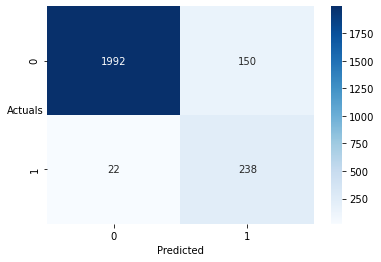

In [322]:
sns.heatmap((metrics.confusion_matrix(Default_train['default'],y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);

In [323]:
print(metrics.classification_report(Default_train['default'],y_class_pred,digits=3))

              precision    recall  f1-score   support

         0.0      0.989     0.930     0.959      2142
         1.0      0.613     0.915     0.735       260

    accuracy                          0.928      2402
   macro avg      0.801     0.923     0.847      2402
weighted avg      0.948     0.928     0.934      2402



In [324]:
# predicted probability values on test dataset

y_prob_pred_test = model_9.predict(Default_test)
y_prob_pred_test.round(3)

251     0.706
3493    0.000
3063    0.000
2384    0.001
1679    0.016
604     0.003
3434    0.000
2244    0.000
2523    0.000
2162    0.000
3102    0.000
1638    0.101
2046    0.000
1241    0.143
133     0.255
2294    0.001
2139    0.000
2844    0.011
1360    0.050
2896    0.000
407     0.233
1270    0.016
2021    0.012
1380    0.000
2938    0.050
2623    0.387
2992    0.000
1157    0.000
1036    0.024
1961    0.027
1700    0.000
283     0.550
3122    0.001
3533    0.000
655     0.110
3327    0.000
1127    0.004
2051    0.077
40      1.000
1536    0.000
1154    0.018
373     0.412
2081    0.000
3453    0.000
2873    0.000
3120    0.000
3279    0.002
1644    0.012
2318    0.000
2820    0.000
1735    0.032
1221    0.031
3165    0.001
1983    0.002
2892    0.000
454     0.363
2838    0.000
86      0.813
1741    0.093
723     0.129
1026    0.022
911     0.009
1266    0.032
2776    0.000
3000    0.000
761     0.005
92      1.000
2815    0.009
2209    0.001
611     0.087
3309    0.000
3245  

In [325]:
y_class_pred=[]
for i in range(0,len(y_prob_pred_test)):
    if np.array(y_prob_pred_test)[i]>0.1689:
        a=1
    else:
        a=0
    y_class_pred.append(a)

### Model Evaluation on the Test Data

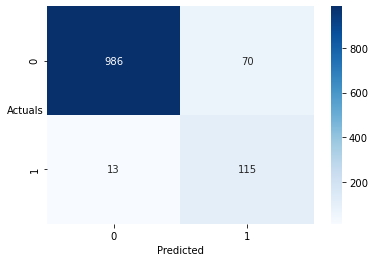

In [326]:
sns.heatmap((metrics.confusion_matrix(Default_test['default'],y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);

In [327]:
print(metrics.classification_report(Default_test['default'],y_class_pred,digits=3))

              precision    recall  f1-score   support

         0.0      0.987     0.934     0.960      1056
         1.0      0.622     0.898     0.735       128

    accuracy                          0.930      1184
   macro avg      0.804     0.916     0.847      1184
weighted avg      0.947     0.930     0.935      1184



### Trying smote for a better prediction with best 15 features taken

In [328]:
from imblearn import under_sampling, over_sampling
from imblearn.over_sampling import SMOTE
from sklearn.metrics import confusion_matrix, classification_report

In [329]:
from imblearn.over_sampling import SMOTE 
sm = SMOTE(random_state=33)
X_res, y_res = sm.fit_resample(X_train, y_train)

In [330]:
selector_smote = selector.fit(X_res, y_res)
selector_smote.n_features_

15

In [331]:
pred_train_smote = selector_smote.predict(X_res)
pred_test_smote = selector_smote.predict(X_test)

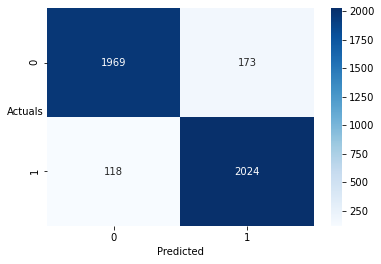

In [332]:
sns.heatmap((metrics.confusion_matrix(y_res,pred_train_smote)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);

In [333]:
print(classification_report(y_res, pred_train_smote))

              precision    recall  f1-score   support

         0.0       0.94      0.92      0.93      2142
         1.0       0.92      0.94      0.93      2142

    accuracy                           0.93      4284
   macro avg       0.93      0.93      0.93      4284
weighted avg       0.93      0.93      0.93      4284



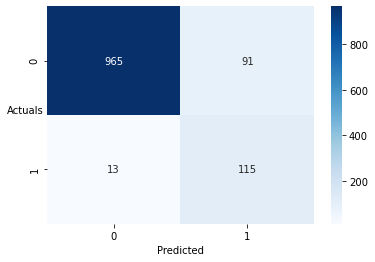

In [334]:
sns.heatmap((metrics.confusion_matrix(y_test,pred_test_smote)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);

In [335]:
print(classification_report(y_test, pred_test_smote))

              precision    recall  f1-score   support

         0.0       0.99      0.91      0.95      1056
         1.0       0.56      0.90      0.69       128

    accuracy                           0.91      1184
   macro avg       0.77      0.91      0.82      1184
weighted avg       0.94      0.91      0.92      1184



### Trying smote for a better prediction with best 6 features selected after modeling (As per model 9)

In [336]:
X_train.columns

Index(['Networth', 'Capital_Employed', 'Total_Debt', 'Selling_Cost', 'PBIDT',
       'Rev_exp_in_forex', 'Book_Value_Unit_Curr', 'Market_Capitalisation',
       'CEPS_annualised_Unit_Curr', 'ROG_Net_Worth_perc', 'Curr_Ratio_Latest',
       'Inventory_Ratio_Latest', 'Debtors_Ratio_Latest',
       'Interest_Cover_Ratio_Latest', 'Value_of_Output_to_Gross_Block'],
      dtype='object')

In [341]:
X_train_new = X_train[['Networth', 'Total_Debt', 'PBIDT', 'Book_Value_Unit_Curr','ROG_Net_Worth_perc','Value_of_Output_to_Gross_Block']]
X_test_new = X_test[['Networth', 'Total_Debt', 'PBIDT', 'Book_Value_Unit_Curr','ROG_Net_Worth_perc','Value_of_Output_to_Gross_Block']]
X_train_new.columns

Index(['Networth', 'Total_Debt', 'PBIDT', 'Book_Value_Unit_Curr',
       'ROG_Net_Worth_perc', 'Value_of_Output_to_Gross_Block'],
      dtype='object')

In [338]:
sm = SMOTE(random_state=33)
X_res, y_res = sm.fit_resample(X_train_new, y_train)

In [339]:
selector_smote = selector.fit(X_res, y_res)
selector_smote.n_features_

6

In [342]:
pred_train_smote = selector_smote.predict(X_res)
pred_test_smote = selector_smote.predict(X_test_new)

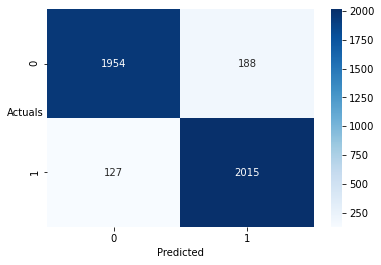

In [343]:
sns.heatmap((metrics.confusion_matrix(y_res,pred_train_smote)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);

In [344]:
print(classification_report(y_res, pred_train_smote))

              precision    recall  f1-score   support

         0.0       0.94      0.91      0.93      2142
         1.0       0.91      0.94      0.93      2142

    accuracy                           0.93      4284
   macro avg       0.93      0.93      0.93      4284
weighted avg       0.93      0.93      0.93      4284



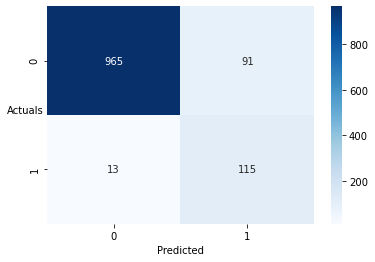

In [346]:
sns.heatmap((metrics.confusion_matrix(y_test,pred_test_smote)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);

In [347]:
print(classification_report(y_test, pred_test_smote))

              precision    recall  f1-score   support

         0.0       0.99      0.91      0.95      1056
         1.0       0.56      0.90      0.69       128

    accuracy                           0.91      1184
   macro avg       0.77      0.91      0.82      1184
weighted avg       0.94      0.91      0.92      1184

